# Introduction

This is a continuation of the prior notebook on modelling.

# Content

1. [Module Dictionary](#Module-Dictionary)
2. [BATS](#BATS)
3. [TBATS](#TBATS)
4. [Kalman Filter](#Kalman-Filter)
5. [Long Short-Term Memory (LSTM)](#Long-Short-Term-Memory-(LSTM))
6. [Predicting Quarterly GDP with Monthly GDP](#Predicting-Quarterly-GDP-with-Monthly-GDP)
7. [End of Notebook](#End-of-Notebook)

Feel free to click on the following notebooks to 'fast forward' to other sections of this project.

|Notebook Title|Description|
|---|---|
|[Introduction & Data Cleaning](01_Intro_Data_Cleaning.ipynb)|This notebook contains the introduction of the project, background motivation, problem statement and the inspection and cleaning of data.|
|[EDA](02_EDA.ipynb)|This notebook contains details on Exploratory Data Analysis.|
|[Modelling](03_Modelling.ipynb)|This notebook contains details on Modelling the data from a time series perspective.|
|[Modelling 2](04_Modelling2.ipynb)|This notebook contains details on time series Modelling with ARIMA, SARIMA and SARIMAX.|
|[Evaluation & Conclusion](05_Eval_Concl.ipynb)|This notebook contains details on model selection, evaluation and conclusion to the project|

# Module Dictionary

Here is a summary of the functions and a brief description of what they do which I may call upon from zul_modules.

|Name|Brief Description|
|---|---|
|bats(arguments)|Function completes full BATS pipeline from model fitting, forecasting, formatting, RMSE calculations and plotting|
|tbats(arguments)|Function completes full TBATS pipeline from model fitting, forecasting, formatting, RMSE calculations and plotting|
|kalman_filter(arguments)|Function completes full Kalman Filter pipeline from model fitting, forecasting, formatting, RMSE calculations and plotting|
|sequence_check(y/X_train, y/X_test)|Sequence check to check for sequence of dates between train and test|
|lstm(arguments)|Function completes full LSTM pipeline from model fitting, forecasting, formatting, RMSE calculations and plotting|
|sarimax_pipeline(arguments)|Pipeline for instantiating, fitting, plotting and measuring (Pyramid)ARIMA predictions with Seasonality and Exogenous variables|
|show_values(y_pred, y_test)|Show y_pred and y_test values to compare how far they are off  numerically|

# Libraries Used

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
import zul_module as zm

/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
2023-09-11 12:24:16.327380: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Import

In [2]:
# importing all dataframes of interest as pickle files
all_features_2006_q_diff = pd.read_pickle('../assets/all_features_2006_q_diff.pkl')
all_features_2006_m = pd.read_pickle('../assets/all_features_2006_m.pkl')
gdp_m_q_uns = pd.read_pickle('../assets/gdp_m_q_uns.pkl')
gdp_m_q = pd.read_pickle('../assets/gdp_m_q.pkl')
gdp_m_q_ss = pd.read_pickle('../assets/gdp_m_q_ss.pkl')

# BATS

BATS, which stands for "Box-Cox Transformation, ARMA errors, Trend, and Seasonal components," is a time series forecasting model designed to capture and model various components of a time series data, including trend, seasonality, and autoregressive and moving average (ARMA) components. It is a statistical modeling approach used for time series forecasting and is particularly useful for univariate time series data.

BATS is an extension of the ARIMA (AutoRegressive Integrated Moving Average) model, which is a widely used method for time series forecasting.

The Box-Cox transformation is a mathematical transformation applied to time series data as a preprocessing step before modeling. The purpose of the Box-Cox transformation is to stabilize the variance and make the data more closely follow a normal distribution.

As the data has been adjusted for seasonality, and is represented in percentage difference terms I do not expect BATS to perform meaningfully better than other models.

## BATS Quarterly GDP

### BATS Predicting 1 Year

/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


========== RMSE ==========

BATS Test Root Mean Squared Error (RMSE): 1.14

========== Predicted Value(s) ==========
Period
2022-06-30    0.174986
2022-09-30    1.340331
2022-12-31    2.272606
2023-03-31    3.018427
Freq: Q-DEC, Name: yhat, dtype: float64
========== Test Value(s) ==========
Period
2022-06-30   -0.6
2022-09-30    3.2
2022-12-31    2.6
2023-03-31    2.0
Freq: Q-DEC, Name: gdp_q, dtype: float64


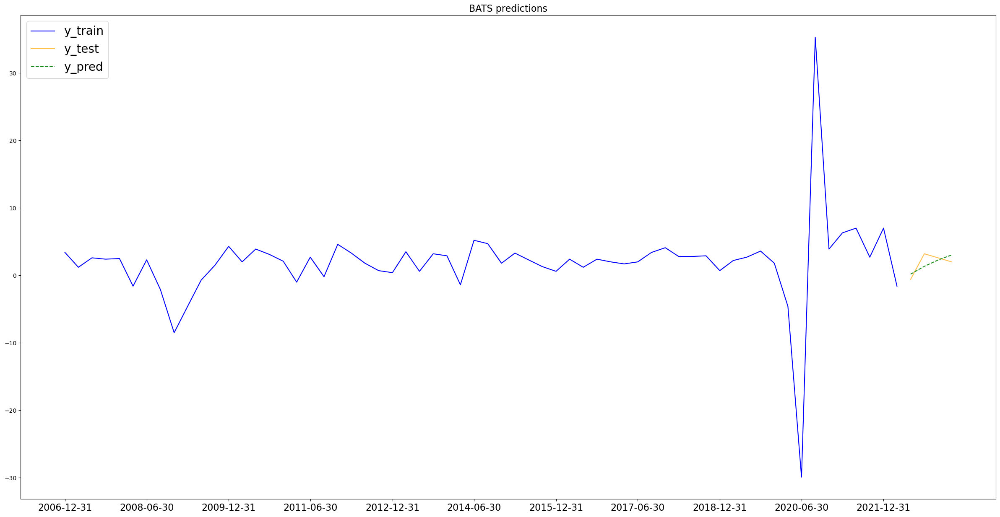

In [3]:
bats_pred = zm.bats(all_features_2006_q_diff, 'gdp_q', 4, 6)

##### Observations

I can observe that BATS as unable to predict the direction correctly for Q2 2022 and predicted magnitude was inconsistent with y_test.

### BATS Predicting 1 Quarter

/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


========== RMSE ==========

BATS Test Root Mean Squared Error (RMSE): 0.87

========== Predicted Value(s) ==========
Period
2023-03-31    2.868843
Freq: Q-DEC, Name: yhat, dtype: float64
========== Test Value(s) ==========
Period
2023-03-31    2.0
Freq: Q-DEC, Name: gdp_q, dtype: float64


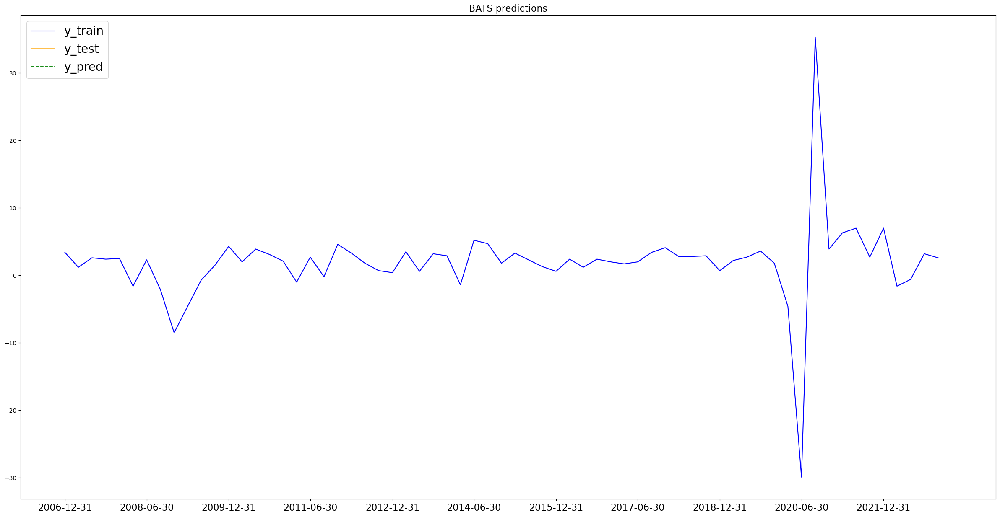

In [4]:
bats_pred = zm.bats(all_features_2006_q_diff, 'gdp_q', 1, 6)

##### Observations

I note that y_test and y_pred is not visually observable. From a numerical perspective I can observe that BATS was predicting growth that was in the correct direction and of a magnitude that is somewhat similar to y_test.

### Observing for BATS 'Robustness'

/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


========== RMSE ==========

BATS Test Root Mean Squared Error (RMSE): 11.60

========== Predicted Value(s) ==========
Period
2019-03-31    1.056278
2019-06-30    1.206271
2019-09-30    1.269418
2019-12-31    1.296003
2020-03-31    1.307195
2020-06-30    1.311907
2020-09-30    1.313891
2020-12-31    1.314726
2021-03-31    1.315078
2021-06-30    1.315226
2021-09-30    1.315288
2021-12-31    1.315314
2022-03-31    1.315325
2022-06-30    1.315330
2022-09-30    1.315332
2022-12-31    1.315333
2023-03-31    1.315333
Freq: Q-DEC, Name: yhat, dtype: float64
========== Test Value(s) ==========
Period
2019-03-31     2.2
2019-06-30     2.7
2019-09-30     3.6
2019-12-31     1.8
2020-03-31    -4.6
2020-06-30   -29.9
2020-09-30    35.3
2020-12-31     3.9
2021-03-31     6.3
2021-06-30     7.0
2021-09-30     2.7
2021-12-31     7.0
2022-03-31    -1.6
2022-06-30    -0.6
2022-09-30     3.2
2022-12-31     2.6
2023-03-31     2.0
Freq: Q-DEC, Name: gdp_q, dtype: float64


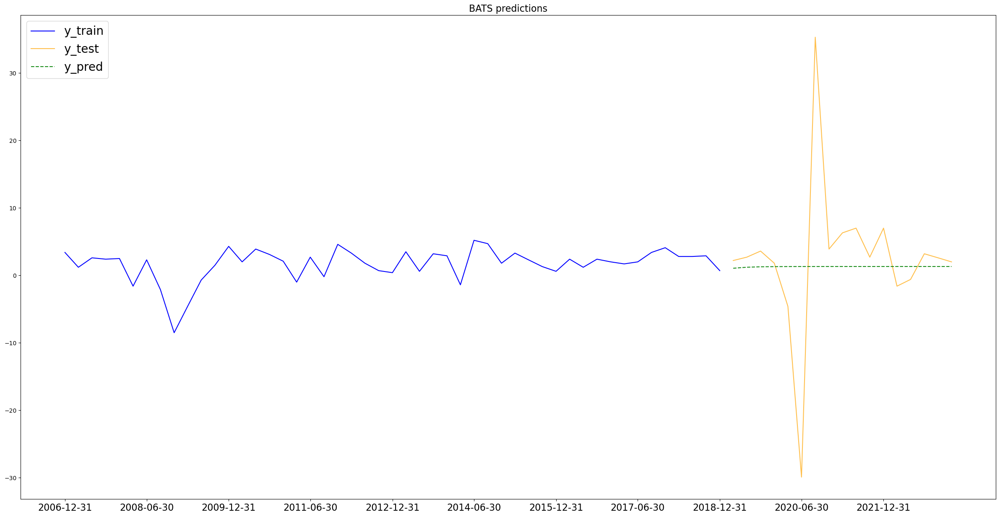

In [5]:
bats_pred = zm.bats(all_features_2006_q_diff, 'gdp_q', 17, 6)

##### Observation

We are able to ovserve that BATS is unable to predict for GDP well. Its predicted values tends towards 1.315 over time is uncharacteristic of actual quarterly GDP. BATS is not a robust model and its predictions diminishes as its predicted duration increases.

##### Summary

|Model|Predicting for|Dataset|Variables|Train RMSE|Test RMSE|
|--|--|--|--|--|--|
|ARIMA (AIC) Baseline|Next 4 Quarters|2006(Q)|gdp_q|6.36|1.68|
|ARIMA (AIC) Baseline|Next 1 Quarter|2006(Q)|gdp_q|6.22|0.36|
|SARIMA (M=1)|Next 4 Quarters|2006(Q)|gdp_q|6.36|1.68|
|SARIMA (M=1)|Next 1 Quarter|2006(Q)|gdp_q|6.22|0.36|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|All Features|2.29|1.82|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|All Features|2.28|1.13|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|AC Features|3.07|1.15|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|AC Features|2.91|1.35|
|SARIMAX (M=1)|Next 1 Quarter1|2006(Q)|payrolls|6.50|0.30|
|Prophet|Next 4 Quarters|2006(Q)|gdp_q|5.82|2.41|
|Prophet|Next 1 Quarter|2006(Q)|gdp_q|5.70|0.75|
|BATS|Next 4 Quarters|2006(Q)|gdp_q|N.A|1.14|
|BATS|Next 1 Quarter|2006(Q)|gdp_q|N.A|0.87|

## BATS Monthly GDP

### BATS Predicting 1 Year

/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


========== RMSE ==========

BATS Test Root Mean Squared Error (RMSE): 0.52

========== Predicted Value(s) ==========
Period
2022-06-01    0.309758
2022-07-01    0.102695
2022-08-01    0.122208
2022-09-01    0.124860
2022-10-01    0.125220
2022-11-01    0.125269
2022-12-01    0.125276
2023-01-01    0.125277
2023-02-01    0.125277
2023-03-01    0.125277
2023-04-01    0.125277
2023-05-01    0.125277
Name: yhat, dtype: float64
========== Test Value(s) ==========
Period
2022-06-01   -0.139146
2022-07-01   -0.012001
2022-08-01    1.436145
2022-09-01   -0.467389
2022-10-01    0.258553
2022-11-01    0.401830
2022-12-01   -0.154016
2023-01-01    0.665956
2023-02-01   -0.269493
2023-03-01   -0.058559
2023-04-01    0.197209
2023-05-01    0.613057
Name: real_gdp_m, dtype: float64


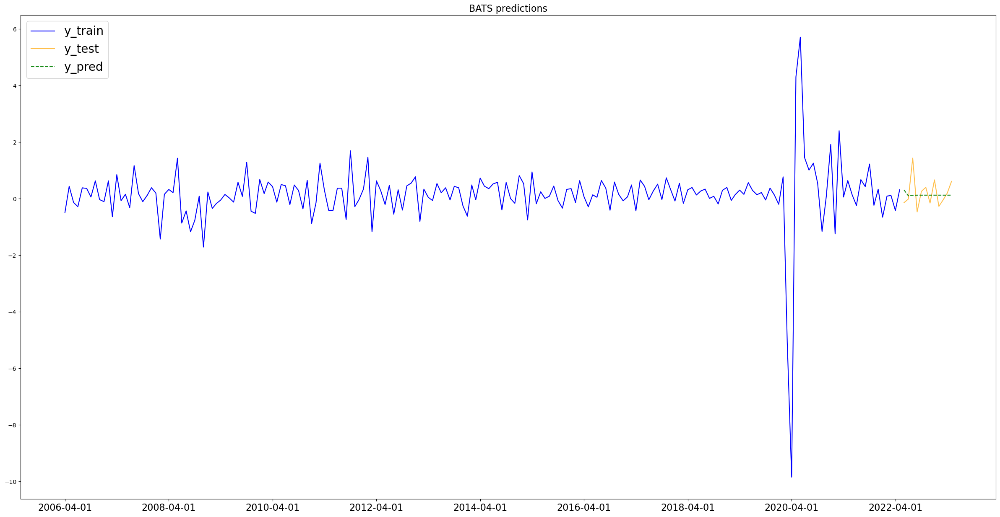

In [6]:
bats_pred = zm.bats(all_features_2006_m, 'real_gdp_m', 12, 24)

##### Observations

I can observe that BATS could only predict for positive values and over time, its values tend towards 0.125. BATS could not predict for the next 12 months well.

### BATS Predicting 1 Quarter

/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


========== RMSE ==========

BATS Test Root Mean Squared Error (RMSE): 0.27

========== Predicted Value(s) ==========
Period
2023-03-01   -0.117053
2023-04-01    0.282273
2023-05-01    0.152635
Name: yhat, dtype: float64
========== Test Value(s) ==========
Period
2023-03-01   -0.058559
2023-04-01    0.197209
2023-05-01    0.613057
Name: real_gdp_m, dtype: float64


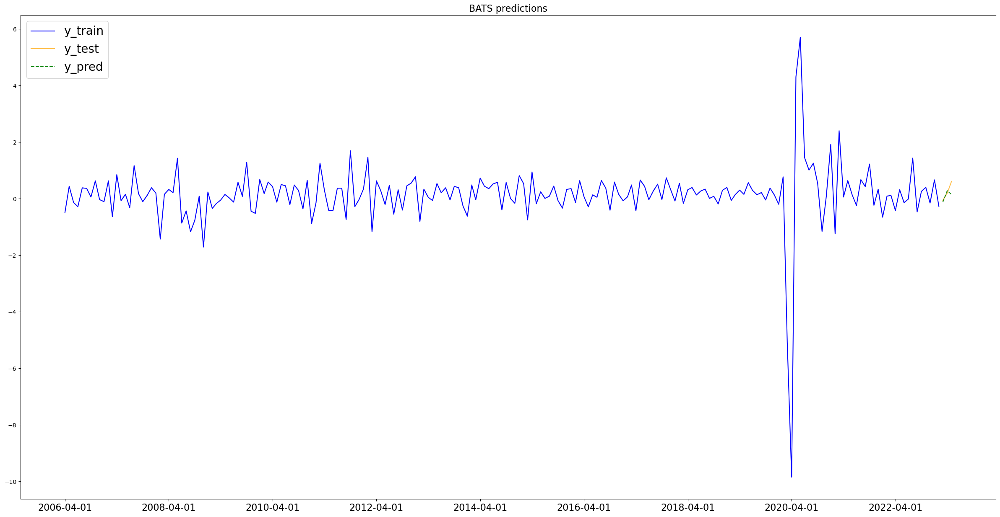

In [7]:
bats_pred = zm.bats(all_features_2006_m, 'real_gdp_m', 3, 24)

##### Observations

I can observe that BATS is able to predict the direction correctly for all periods and predicted magnitude was somewhat close to y_test.

##### Observation

We are able to ovserve that BATS is unable to predict for GDP well. Its predicted values tends towards 1.315 over time is uncharacteristic of actual quarterly GDP. BATS is not a robust model and its predictions diminishes as its predicted duration increases.

##### Summary

|Model|Predicting for|Dataset|Variables|Train RMSE|Test RMSE|
|--|--|--|--|--|--|
|ARIMA (AIC) Baseline|Next 12 Months|2006(M)|real_gdp_m|1.11|0.51|
|ARIMA (AIC) Baseline|Next 3 Months|2006(M)|real_gdp_m|1.09|0.25|
|SARIMA (M=2)|Next 12 Months|2006(M)|real_gdp_m|1.11|0.51|
|SARIMA (M=2)|Next 3 Months|2006(M)|real_gdp_m|1.09|0.25|
|SARIMAX (M=2)|Next 12 Months|2006(M)|All Features|0.42|0.53|
|SARIMAX (M=2)|Next 3 Months|2006(M)|All Features|0.43|0.40|
|SARIMAX (M=2)|Next 12 Months|2006(M)|All Features|0.49|0.52|
|SARIMAX (M=2)|Next 3 Months|2006(M)|All Features|0.48|0.37|
|Prophet|Next 12 Months|2006(M)|real_gdp_m|1.02|0.54|
|Prophet|Next 3 Months|2006(M)|real_gdp_m|1.00|0.56|
|BATS|Next 12 Months|2006(M)|real_gdp_m|N.A|0.52|
|BATS|Next 3 Months|2006(M)|real_gdp_m|N.A|0.27|

BATS seem to perform similarly to baseline model, ARIMA(AIC). This could be due to the fact that as predicted periods get shorter, models that focus on its Autoregressive and Moving average components performs better than those that do not. It is also no surprise that BATS performs similarly as it is an extension of ARIMA models anyway and as the target variable is already seasonally adjusted and stationary, the Box Cox component of the BATS model could not produce meaningful RMSE improvements.

# TBATS

TBATS, which stands for "Trigonometric Seasonal Box-Cox Transformation with ARMA Errors, Trend, and Seasonal Components," is a sophisticated and flexible time series forecasting method. It was developed to handle time series data that exhibit complex seasonal patterns, trends, and other underlying structures. TBATS is particularly useful for forecasting data with multiple seasonal components, such as daily, weekly, and yearly seasonality, as it incorporates trigonometric functions to capture these patterns

TBATS is an extension of BATS.

TBATS employs trigonometric functions (sine and cosine) to model multiple seasonal patterns in the data. This is especially useful for handling time series that exhibit complex seasonal behavior, where traditional methods like SARIMA may struggle.

As the data has been adjusted for seasonality, I do not expect TBATS to produce meaningfully better predictions.

## TBATS Quarterly GDP

### TBATS Predicting 1 Year

/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this 

========== RMSE ==========

TBATS Test Root Mean Squared Error (RMSE): 1.14

========== Predicted Value(s) ==========
Period
2022-06-30    0.174986
2022-09-30    1.340331
2022-12-31    2.272606
2023-03-31    3.018427
Freq: Q-DEC, Name: yhat, dtype: float64
========== Test Value(s) ==========
Period
2022-06-30   -0.6
2022-09-30    3.2
2022-12-31    2.6
2023-03-31    2.0
Freq: Q-DEC, Name: gdp_q, dtype: float64


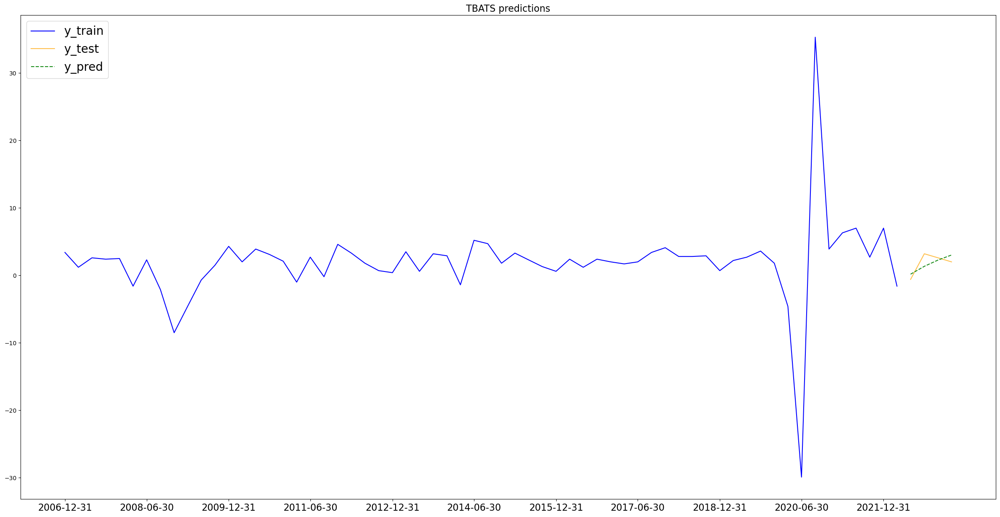

In [8]:
tbats_pred = zm.tbats(all_features_2006_q_diff, 'gdp_q', 4, 6)

##### Observations

I can observe that TBATS as unable to predict the direction correctly for Q2 2022 and predicted magnitude was inconsistent with y_test. I note that TBATS predictions were exactly the same as BATS.

### TBATS Predicting 1 Quarter

/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this 

========== RMSE ==========

TBATS Test Root Mean Squared Error (RMSE): 0.87

========== Predicted Value(s) ==========
Period
2023-03-31    2.868843
Freq: Q-DEC, Name: yhat, dtype: float64
========== Test Value(s) ==========
Period
2023-03-31    2.0
Freq: Q-DEC, Name: gdp_q, dtype: float64


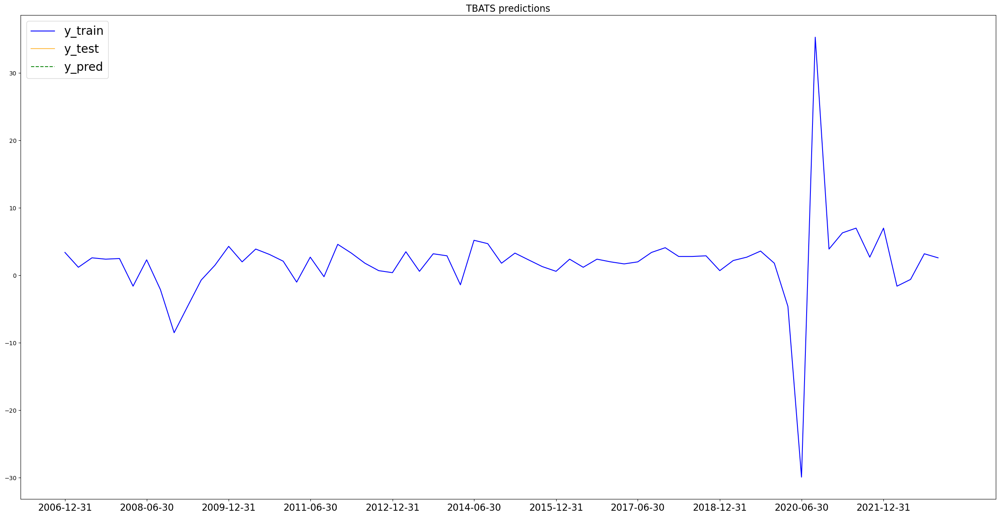

In [9]:
tbats_pred = zm.tbats(all_features_2006_q_diff, 'gdp_q', 1, 6)

##### Observations

I note that y_test and y_pred is not visually observable. From a numerical perspective I can observe that TBATS was predicting growth that was in the correct direction and of a magnitude that is somewhat similar to y_test. I note that TBATS prediction is exactly the same as BATS.

##### Summary

|Model|Predicting for|Dataset|Variables|Train RMSE|Test RMSE|
|--|--|--|--|--|--|
|ARIMA (AIC) Baseline|Next 4 Quarters|2006(Q)|gdp_q|6.36|1.68|
|ARIMA (AIC) Baseline|Next 1 Quarter|2006(Q)|gdp_q|6.22|0.36|
|SARIMA (M=1)|Next 4 Quarters|2006(Q)|gdp_q|6.36|1.68|
|SARIMA (M=1)|Next 1 Quarter|2006(Q)|gdp_q|6.22|0.36|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|All Features|2.29|1.82|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|All Features|2.28|1.13|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|AC Features|3.07|1.15|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|AC Features|2.91|1.35|
|SARIMAX (M=1)|Next 1 Quarter1|2006(Q)|payrolls|6.50|0.30|
|Prophet|Next 4 Quarters|2006(Q)|gdp_q|5.82|2.41|
|Prophet|Next 1 Quarter|2006(Q)|gdp_q|5.70|0.75|
|BATS|Next 4 Quarters|2006(Q)|gdp_q|N.A|1.14|
|BATS|Next 1 Quarter|2006(Q)|gdp_q|N.A|0.87|
|TBATS|Next 4 Quarters|2006(Q)|gdp_q|N.A|1.14|
|TBATS|Next 1 Quarter|2006(Q)|gdp_q|N.A|0.87|

## TBATS Monthly GDP

### TBATS Predicting 1 Year

/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this 

========== RMSE ==========

TBATS Test Root Mean Squared Error (RMSE): 0.52

========== Predicted Value(s) ==========
Period
2022-06-01    0.309758
2022-07-01    0.102695
2022-08-01    0.122208
2022-09-01    0.124860
2022-10-01    0.125220
2022-11-01    0.125269
2022-12-01    0.125276
2023-01-01    0.125277
2023-02-01    0.125277
2023-03-01    0.125277
2023-04-01    0.125277
2023-05-01    0.125277
Name: yhat, dtype: float64
========== Test Value(s) ==========
Period
2022-06-01   -0.139146
2022-07-01   -0.012001
2022-08-01    1.436145
2022-09-01   -0.467389
2022-10-01    0.258553
2022-11-01    0.401830
2022-12-01   -0.154016
2023-01-01    0.665956
2023-02-01   -0.269493
2023-03-01   -0.058559
2023-04-01    0.197209
2023-05-01    0.613057
Name: real_gdp_m, dtype: float64


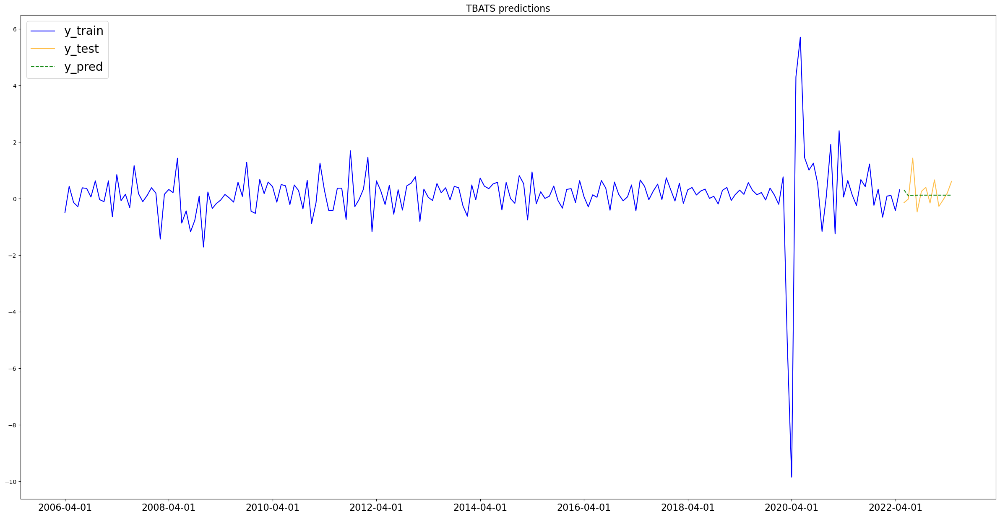

In [10]:
tbats_pred = zm.tbats(all_features_2006_m, 'real_gdp_m', 12, 24)

##### Observations

I can observe that TBATS could only predict for positive values and over time, its values tend towards 0.125. TBATS could not predict for the next 12 months well.

### TBATS Predicting 1 Quarter

/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/zulthyllas/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this 

========== RMSE ==========

TBATS Test Root Mean Squared Error (RMSE): 0.27

========== Predicted Value(s) ==========
Period
2023-03-01   -0.117053
2023-04-01    0.282273
2023-05-01    0.152635
Name: yhat, dtype: float64
========== Test Value(s) ==========
Period
2023-03-01   -0.058559
2023-04-01    0.197209
2023-05-01    0.613057
Name: real_gdp_m, dtype: float64


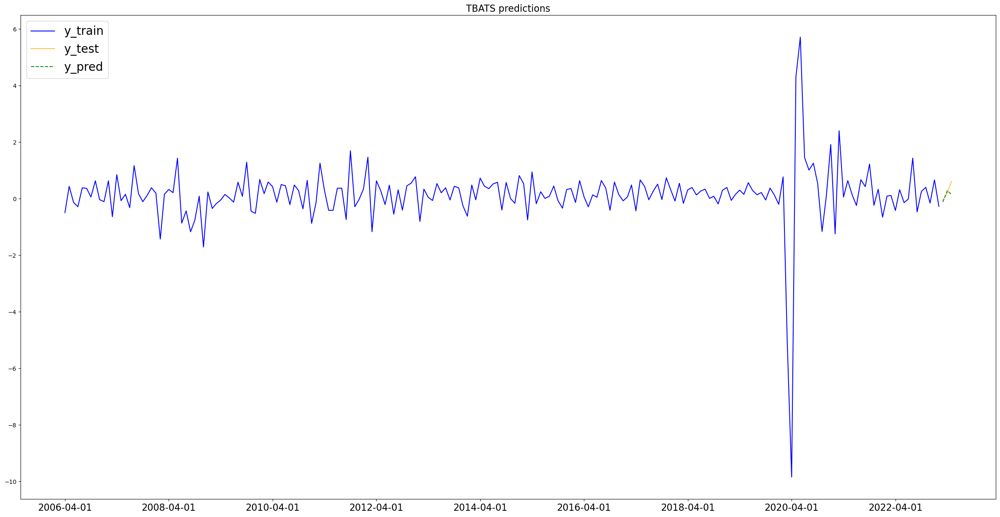

In [11]:
tbats_pred = zm.tbats(all_features_2006_m, 'real_gdp_m', 3, 24)

##### Observations

I can observe that TBATS is able to predict the direction correctly for all periods and predicted magnitude was somewhat close to y_test.

##### Summary

|Model|Predicting for|Dataset|Variables|Train RMSE|Test RMSE|
|--|--|--|--|--|--|
|ARIMA (AIC) Baseline|Next 12 Months|2006(M)|real_gdp_m|1.11|0.51|
|ARIMA (AIC) Baseline|Next 3 Months|2006(M)|real_gdp_m|1.09|0.25|
|SARIMA (M=2)|Next 12 Months|2006(M)|real_gdp_m|1.11|0.51|
|SARIMA (M=2)|Next 3 Months|2006(M)|real_gdp_m|1.09|0.25|
|SARIMAX (M=2)|Next 12 Months|2006(M)|All Features|0.42|0.53|
|SARIMAX (M=2)|Next 3 Months|2006(M)|All Features|0.43|0.40|
|SARIMAX (M=2)|Next 12 Months|2006(M)|All Features|0.49|0.52|
|SARIMAX (M=2)|Next 3 Months|2006(M)|All Features|0.48|0.37|
|Prophet|Next 12 Months|2006(M)|real_gdp_m|1.02|0.54|
|Prophet|Next 3 Months|2006(M)|real_gdp_m|1.00|0.56|
|BATS|Next 12 Months|2006(M)|real_gdp_m|N.A|0.52|
|BATS|Next 3 Months|2006(M)|real_gdp_m|N.A|0.27|
|TBATS|Next 12 Months|2006(M)|real_gdp_m|N.A|0.52|
|TBATS|Next 3 Months|2006(M)|real_gdp_m|N.A|0.27|

TBATS seem to perform eactly the same as BATS. We are unable to observe the trigonometric functions produce meaningful results. While this is not entirely susprising due to the seasonally adjusted nature of the variable, this finding could also show that variable does in fact have all components of seasonality removed.

# Kalman Filter (State Space Model)

The Kalman Filter is based on the state space model, which describes how a system evolves over time. 

A state space model (SSM) is a mathematical framework used to describe and analyze dynamic systems over time. It's a versatile and widely used tool in various fields, including engineering, economics, physics, biology, and machine learning. State space models are particularly useful for modeling systems that evolve over time, where you want to estimate and predict the unobserved (hidden) states of the system based on noisy observations.

The Kalman Filter is a recursive and optimal estimation algorithm used for estimating the state of a dynamic system from a series of noisy measurements. It's particularly useful in applications where you have noisy sensor data and want to obtain a more accurate and filtered estimate of the true state of the system. The Kalman Filter is widely used in various fields, including engineering, robotics, economics, and finance.

I will be defining a dimension of 2 to measure and predict for x (Position and velocity)

## Kalman Filter Quarterly GDP

### Kalman Filter Predicting 1 Year

/Users/zulthyllas/Documents/GA/my_materials/Predicting GDP/notebooks/zul_module.py:778: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  kf_predictions['predictions'] = predictions
/Users/zulthyllas/Documents/GA/my_materials/Predicting GDP/notebooks/zul_module.py:779: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  kf_predictions['filtered_state_means'] = filtered_state_means


========== RMSE ==========

Kalman Filter Train Root Mean Squared Error (RMSE): 4.09
Kalman Filter Test Root Mean Squared Error (RMSE): 5.42

========== Predicted Value(s) ==========
Period
2022-06-30    0.422272
2022-09-30   -2.810581
2022-12-31   -4.019733
2023-03-31   -4.052974
Freq: Q-DEC, Name: predictions, dtype: float64
========== Test Value(s) ==========
Period
2022-06-30   -0.6
2022-09-30    3.2
2022-12-31    2.6
2023-03-31    2.0
Freq: Q-DEC, Name: gdp_q, dtype: float64


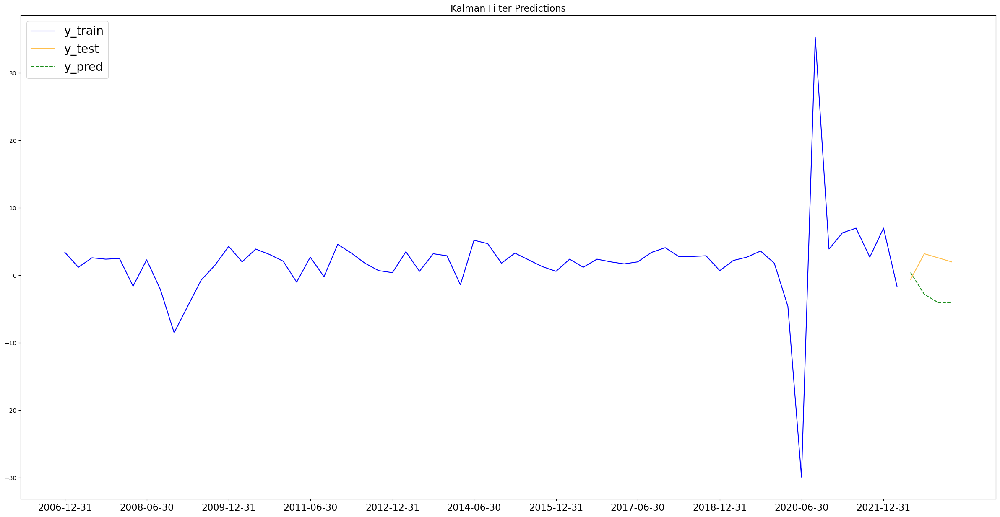

In [12]:
kf_predictions = zm.kalman_filter(all_features_2006_q_diff, 'gdp_q', 4, 6)

##### Observations

From the above, we can observe that Kalman Filter predictions was entirely wrong in direction and its magnitude seem to be a function of its past and most recent velocity.

### Kalman Filter Predicting 1 Quarter

/Users/zulthyllas/Documents/GA/my_materials/Predicting GDP/notebooks/zul_module.py:778: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  kf_predictions['predictions'] = predictions
/Users/zulthyllas/Documents/GA/my_materials/Predicting GDP/notebooks/zul_module.py:779: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  kf_predictions['filtered_state_means'] = filtered_state_means


========== RMSE ==========

Kalman Filter Train Root Mean Squared Error (RMSE): 4.01
Kalman Filter Test Root Mean Squared Error (RMSE): 0.82

========== Predicted Value(s) ==========
Period
2023-03-31    1.182339
Freq: Q-DEC, Name: predictions, dtype: float64
========== Test Value(s) ==========
Period
2023-03-31    2.0
Freq: Q-DEC, Name: gdp_q, dtype: float64


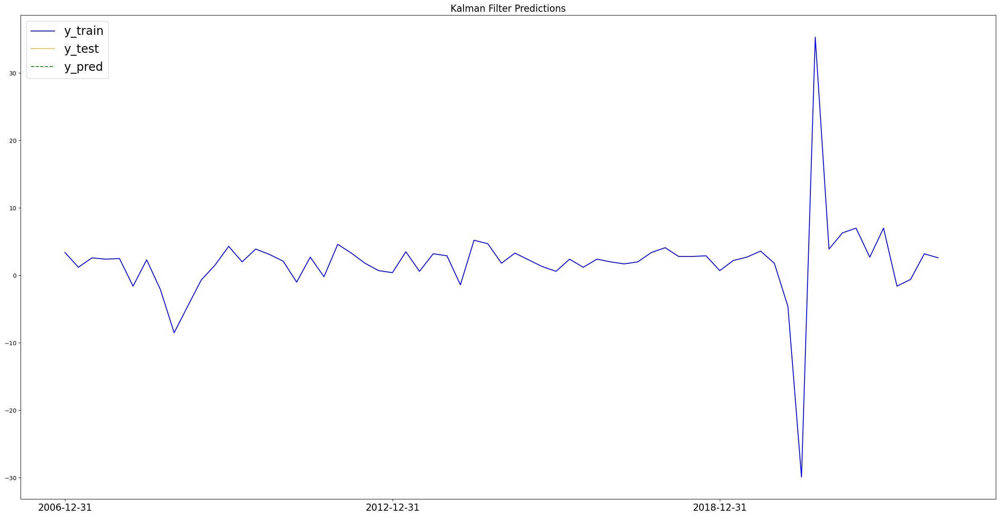

In [13]:
kf_predictions = zm.kalman_filter(all_features_2006_q_diff, 'gdp_q', 1, 24)

##### Observations

I note that y_test and y_pred is not visually observable. From a numerical perspective I can observe that TBATS was predicting growth that was in the correct direction but of a magnitude that is inconsistent to y_test.

##### Summary

|Model|Predicting for|Dataset|Variables|Train RMSE|Test RMSE|
|--|--|--|--|--|--|
|ARIMA (AIC) Baseline|Next 4 Quarters|2006(Q)|gdp_q|6.36|1.68|
|ARIMA (AIC) Baseline|Next 1 Quarter|2006(Q)|gdp_q|6.22|0.36|
|SARIMA (M=1)|Next 4 Quarters|2006(Q)|gdp_q|6.36|1.68|
|SARIMA (M=1)|Next 1 Quarter|2006(Q)|gdp_q|6.22|0.36|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|All Features|2.29|1.82|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|All Features|2.28|1.13|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|AC Features|3.07|1.15|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|AC Features|2.91|1.35|
|SARIMAX (M=1)|Next 1 Quarter1|2006(Q)|payrolls|6.50|0.30|
|Prophet|Next 4 Quarters|2006(Q)|gdp_q|5.82|2.41|
|Prophet|Next 1 Quarter|2006(Q)|gdp_q|5.70|0.75|
|BATS|Next 4 Quarters|2006(Q)|gdp_q|N.A|1.14|
|BATS|Next 1 Quarter|2006(Q)|gdp_q|N.A|0.87|
|TBATS|Next 4 Quarters|2006(Q)|gdp_q|N.A|1.14|
|TBATS|Next 1 Quarter|2006(Q)|gdp_q|N.A|0.87|
|Kalman Filter|Next 4 Quarters|2006(Q)|gdp_q|4.09|5.42|
|Kalman Filter|Next 1 Quarter|2006(Q)|gdp_q|4.01|0.82|

## Kalman Filter Monthly GDP

### Kalman Filter Predicting 1 Year

/Users/zulthyllas/Documents/GA/my_materials/Predicting GDP/notebooks/zul_module.py:778: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  kf_predictions['predictions'] = predictions
/Users/zulthyllas/Documents/GA/my_materials/Predicting GDP/notebooks/zul_module.py:779: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  kf_predictions['filtered_state_means'] = filtered_state_means


========== RMSE ==========

Kalman Filter Train Root Mean Squared Error (RMSE): 0.69
Kalman Filter Test Root Mean Squared Error (RMSE): 0.50

========== Predicted Value(s) ==========
Period
2022-06-01    0.048020
2022-07-01    0.299983
2022-08-01    0.418317
2022-09-01    0.450803
2022-10-01    0.437413
2022-11-01    0.406056
2022-12-01    0.373227
2023-01-01    0.346722
2023-02-01    0.328734
2023-03-01    0.318442
2023-04-01    0.313835
2023-05-01    0.312790
Name: predictions, dtype: float64
========== Test Value(s) ==========
Period
2022-06-01   -0.139146
2022-07-01   -0.012001
2022-08-01    1.436145
2022-09-01   -0.467389
2022-10-01    0.258553
2022-11-01    0.401830
2022-12-01   -0.154016
2023-01-01    0.665956
2023-02-01   -0.269493
2023-03-01   -0.058559
2023-04-01    0.197209
2023-05-01    0.613057
Name: real_gdp_m, dtype: float64


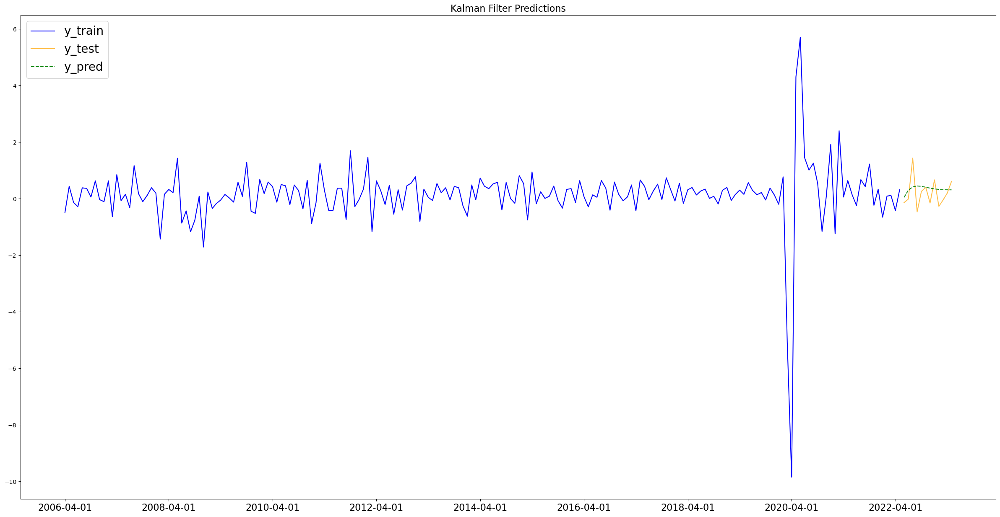

In [14]:
kf_predictions = zm.kalman_filter(all_features_2006_m, 'real_gdp_m', 12, 24)

##### Observations

I can observe that Kalman Filter could only predict for positive values and over time, its values tend towards 0.31. Kalman Filter could not predict for the next 12 months well.

### Kalman Filter Predicting 1 Quarter

/Users/zulthyllas/Documents/GA/my_materials/Predicting GDP/notebooks/zul_module.py:778: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  kf_predictions['predictions'] = predictions
/Users/zulthyllas/Documents/GA/my_materials/Predicting GDP/notebooks/zul_module.py:779: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  kf_predictions['filtered_state_means'] = filtered_state_means


========== RMSE ==========

Kalman Filter Train Root Mean Squared Error (RMSE): 0.68
Kalman Filter Test Root Mean Squared Error (RMSE): 0.66

========== Predicted Value(s) ==========
Period
2023-03-01   -0.040506
2023-04-01   -0.300327
2023-05-01   -0.411663
Name: predictions, dtype: float64
========== Test Value(s) ==========
Period
2023-03-01   -0.058559
2023-04-01    0.197209
2023-05-01    0.613057
Name: real_gdp_m, dtype: float64


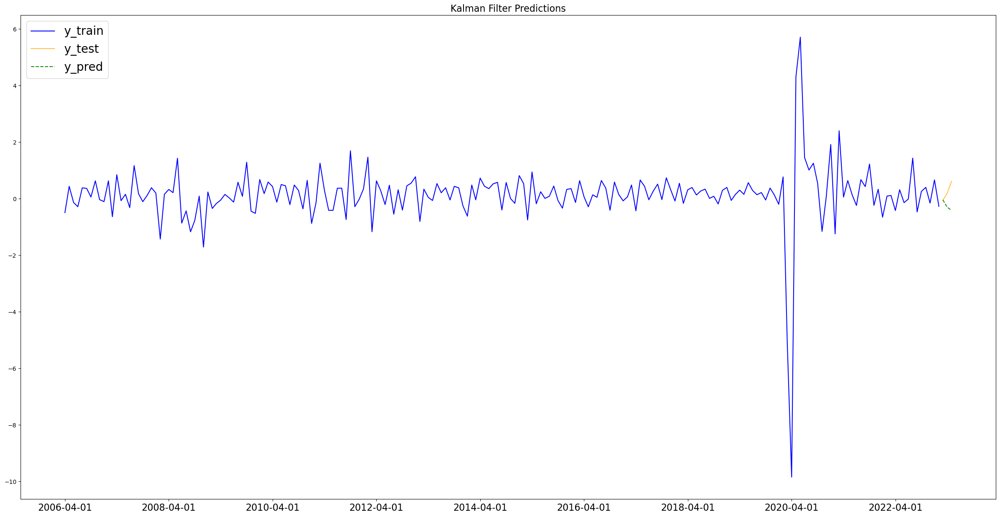

In [15]:
kf_predictions = zm.kalman_filter(all_features_2006_m, 'real_gdp_m', 3, 24)

##### Observations

I can observe that Kalman Filter predicted only for negative values and continued in the same direction for all predicted periods. It seems that predicted values by the Kalman Filter model is influenced by its most recent train position and velocity.

##### Summary

|Model|Predicting for|Dataset|Variables|Train RMSE|Test RMSE|
|--|--|--|--|--|--|
|ARIMA (AIC) Baseline|Next 12 Months|2006(M)|real_gdp_m|1.11|0.51|
|ARIMA (AIC) Baseline|Next 3 Months|2006(M)|real_gdp_m|1.09|0.25|
|SARIMA (M=2)|Next 12 Months|2006(M)|real_gdp_m|1.11|0.51|
|SARIMA (M=2)|Next 3 Months|2006(M)|real_gdp_m|1.09|0.25|
|SARIMAX (M=2)|Next 12 Months|2006(M)|All Features|0.42|0.53|
|SARIMAX (M=2)|Next 3 Months|2006(M)|All Features|0.43|0.40|
|SARIMAX (M=2)|Next 12 Months|2006(M)|All Features|0.49|0.52|
|SARIMAX (M=2)|Next 3 Months|2006(M)|All Features|0.48|0.37|
|Prophet|Next 12 Months|2006(M)|real_gdp_m|1.02|0.54|
|Prophet|Next 3 Months|2006(M)|real_gdp_m|1.00|0.56|
|BATS|Next 12 Months|2006(M)|real_gdp_m|N.A|0.52|
|BATS|Next 3 Months|2006(M)|real_gdp_m|N.A|0.27|
|TBATS|Next 12 Months|2006(M)|real_gdp_m|N.A|0.52|
|TBATS|Next 3 Months|2006(M)|real_gdp_m|N.A|0.27|
|Kalman Filter|Next 12 Months|2006(M)|real_gdp_m|0.69|0.50|
|Kalman Filter|Next 3 Months|2006(M)|real_gdp_m|0.68|0.66|

Kalman Filter is unable to predict for monthly gdp well, even so when the data points appears alot more noisy than quarterly data. 

# Long Short-Term Memory (LSTM)

Long Short-Term Memory (LSTM) is a type of recurrent neural network (RNN) architecture used in deep learning. It is designed to work with sequences of data, making it particularly well-suited for tasks involving time series data among other types of data.

Long Short-Term Memory (LSTM) networks are particularly useful for making time series predictions due to their ability to capture complex temporal dependencies and patterns in sequential data. LSTM networks excel in modeling and predicting time series data because they can capture both short-term and long-term patterns, adapt to varying sequence lengths, and automatically learn relevant features from the data

## LSTM Quarterly GDP (All Features)

### LSTM Predicting 1 Year

In [16]:
# Modifying dataframe due to time series generator & LSTM prediction characteristics and constraints
all_features_2006_q_diff['gdp_q_shift'] = all_features_2006_q_diff['gdp_q'].shift(1)
all_features_2006_q_diff = all_features_2006_q_diff.dropna()

# Inspect
all_features_2006_q_diff.head()

,total_industrial_production,pce,export_growth_rate,consumer_sentiment,retail_sales,import_growth_rate,manufacturers_new_orders,payrolls,hours,gdp_q,oecd_cli_shift,non_farm_payrolls_diff,gdp_q_shift
Period,,,,,,,,,,,,,
2007-03-31,0.173538,0.1,4.437148,-3.176342,0.9,4.287614,2.729490,0.7,0.5,1.2,0.038221,0.1,3.4
2007-06-30,0.018007,0.0,1.074950,-3.397508,-0.7,0.973353,0.145327,0.9,0.3,2.6,0.057761,-0.1,1.2
2007-09-30,0.248212,0.1,0.525873,0.000000,0.4,0.752266,-0.876053,0.2,0.0,2.4,0.084635,0.0,2.6
2007-12-31,0.052443,-0.1,0.793667,-0.788436,-1.2,-0.593389,3.519821,0.3,0.1,2.5,0.062463,0.0,2.4
2008-03-31,-0.325842,0.2,-1.428678,-1.836158,0.2,-2.196113,0.024276,0.7,0.2,-1.6,-0.017221,-0.1,2.5


In [83]:
# Declaring for X to be all other features
y = all_features_2006_q_diff['gdp_q_shift']
X = all_features_2006_q_diff.drop(columns=['gdp_q', 'gdp_q_shift'])

# Train Test Split With All Features for a test period of next 4 Quarters (1 Year)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.12, shuffle=False)

In [67]:
# Sequence check
zm.sequence_check(y_train, y_test)

Each split data head and tail will be printed in sequence of train head, train tail, test head, test tail
Period
2007-03-31    3.4
2007-06-30    1.2
2007-09-30    2.6
2007-12-31    2.4
2008-03-31    2.5
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64
Period
2020-03-31     1.8
2020-06-30    -4.6
2020-09-30   -29.9
2020-12-31    35.3
2021-03-31     3.9
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64
Period
2021-06-30    6.3
2021-09-30    7.0
2021-12-31    2.7
2022-03-31    7.0
2022-06-30   -1.6
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64
Period
2022-03-31    7.0
2022-06-30   -1.6
2022-09-30   -0.6
2022-12-31    3.2
2023-03-31    2.6
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64


Epoch 1/1000
27/27 [==============================] - 4s 25ms/step - loss: 49.4215 - root_mean_squared_error: 7.0300 - val_loss: 4.8444 - val_root_mean_squared_error: 2.2010
Epoch 2/1000
27/27 [==============================] - 0s 5ms/step - loss: 49.4707 - root_mean_squared_error: 7.0335 - val_loss: 4.8243 - val_root_mean_squared_error: 2.1964
Epoch 3/1000
27/27 [==============================] - 0s 5ms/step - loss: 48.9125 - root_mean_squared_error: 6.9937 - val_loss: 4.8357 - val_root_mean_squared_error: 2.1990
Epoch 4/1000
27/27 [==============================] - 0s 5ms/step - loss: 48.7852 - root_mean_squared_error: 6.9846 - val_loss: 4.8612 - val_root_mean_squared_error: 2.2048
Epoch 5/1000
27/27 [==============================] - 0s 5ms/step - loss: 48.8815 - root_mean_squared_error: 6.9915 - val_loss: 4.8330 - val_root_mean_squared_error: 2.1984
Epoch 6/1000
27/27 [==============================] - 0s 5ms/step - loss: 48.6327 - root_mean_squared_error: 6.9737 - val_loss: 4.7862

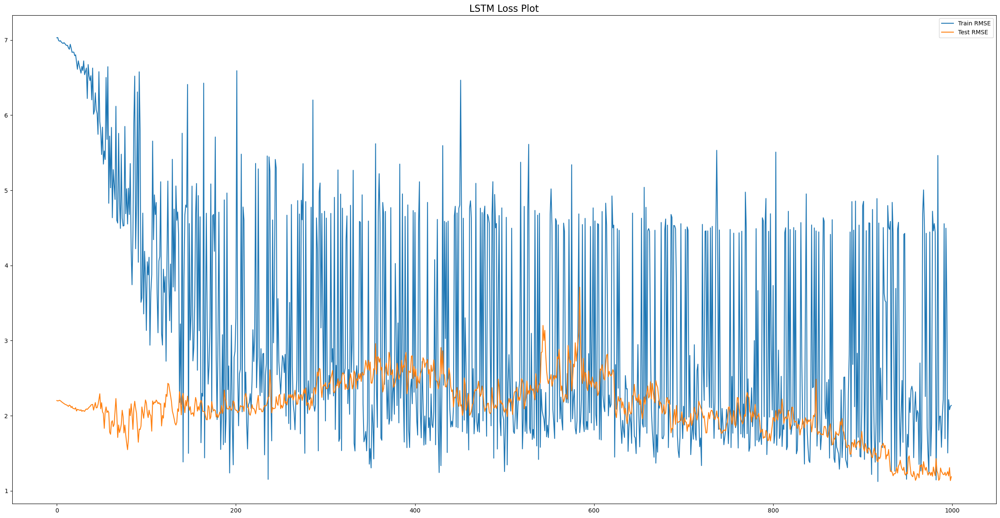

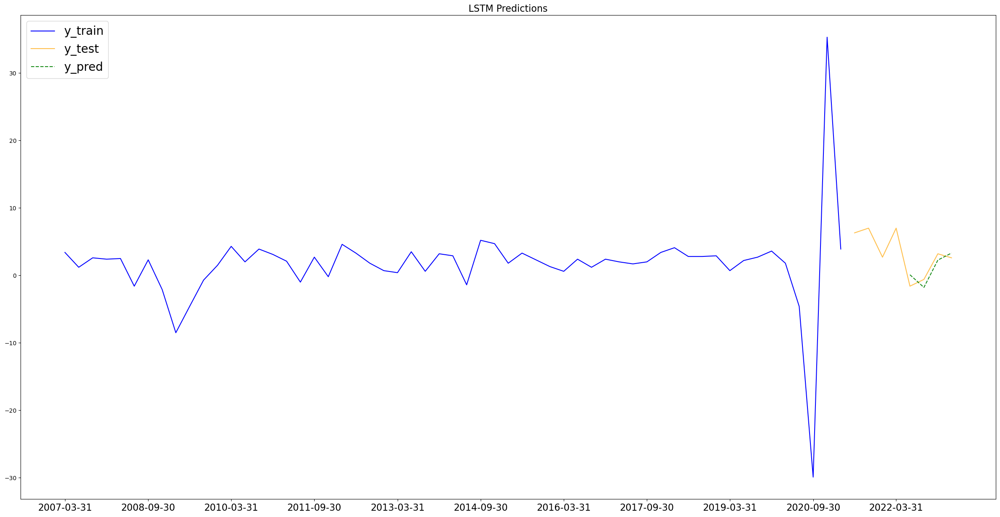

In [68]:
lstm_results = zm.lstm(all_features_2006_q_diff, 'gdp_q_shift', X_train, X_test, y_train, y_test, length=4, batch_size=2, features=11, epoch=1000, periods=4, steps=6)

##### Observations

The below are the better set of hyperparameter tuning set that got me better results in general.

Settings For Model:
- 2 LSTM Layers with 10 nodes in the first and 8 in the second
- 2 dense layers with relu activation with a dropout(0.5) layer in between
- 1 output layer with identity activation
- Adam optimiser (0.001)
- loss = mse, metrics = RMSE
- early_stop with patience of 3

When tuning the hyperparameters, I note that the results are somwhat inconsistent even when the same settings was applied. There are moments where predictions were close to test values and there were moments when it wasnt. Therefore, my observations here will speak genereally of them. 

Further, I note that due to constraints on how Time Series Generator uses past data to train / predict on a future datapoint, the time periods that we will be using in this section to measure and observe LSTM's predictive abilities would be different from other models. With that said, predicted periods remain the same at 4 quarters.

On most occassions, LSTM was not able to predict for direction well. However, there are moments when the model could predict the direction for 1 or two of the period's gdp correctly. Magnitude often appear inconsistent with y_test too. Visually however, LSTM was somewhat acceptable.

### LSTM Predicting 1 Quarter

In [69]:
# Train Test Split With All Features for a test period of next 1 Quarter 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.07, shuffle=False)

In [70]:
# Sequence check
zm.sequence_check(y_train, y_test)

Each split data head and tail will be printed in sequence of train head, train tail, test head, test tail
Period
2007-03-31    3.4
2007-06-30    1.2
2007-09-30    2.6
2007-12-31    2.4
2008-03-31    2.5
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64
Period
2020-12-31    35.3
2021-03-31     3.9
2021-06-30     6.3
2021-09-30     7.0
2021-12-31     2.7
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64
Period
2022-03-31    7.0
2022-06-30   -1.6
2022-09-30   -0.6
2022-12-31    3.2
2023-03-31    2.6
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64
Period
2022-03-31    7.0
2022-06-30   -1.6
2022-09-30   -0.6
2022-12-31    3.2
2023-03-31    2.6
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64


Epoch 1/1000
28/28 [==============================] - 4s 26ms/step - loss: 47.7926 - root_mean_squared_error: 6.9132 - val_loss: 6.0671 - val_root_mean_squared_error: 2.4632
Epoch 2/1000
28/28 [==============================] - 0s 5ms/step - loss: 47.2715 - root_mean_squared_error: 6.8754 - val_loss: 5.6240 - val_root_mean_squared_error: 2.3715
Epoch 3/1000
28/28 [==============================] - 0s 4ms/step - loss: 47.3702 - root_mean_squared_error: 6.8826 - val_loss: 5.1594 - val_root_mean_squared_error: 2.2714
Epoch 4/1000
28/28 [==============================] - 0s 4ms/step - loss: 46.5662 - root_mean_squared_error: 6.8239 - val_loss: 4.8273 - val_root_mean_squared_error: 2.1971
Epoch 5/1000
28/28 [==============================] - 0s 4ms/step - loss: 45.7753 - root_mean_squared_error: 6.7657 - val_loss: 4.1618 - val_root_mean_squared_error: 2.0400
Epoch 6/1000
28/28 [==============================] - 0s 4ms/step - loss: 45.6215 - root_mean_squared_error: 6.7544 - val_loss: 3.3663

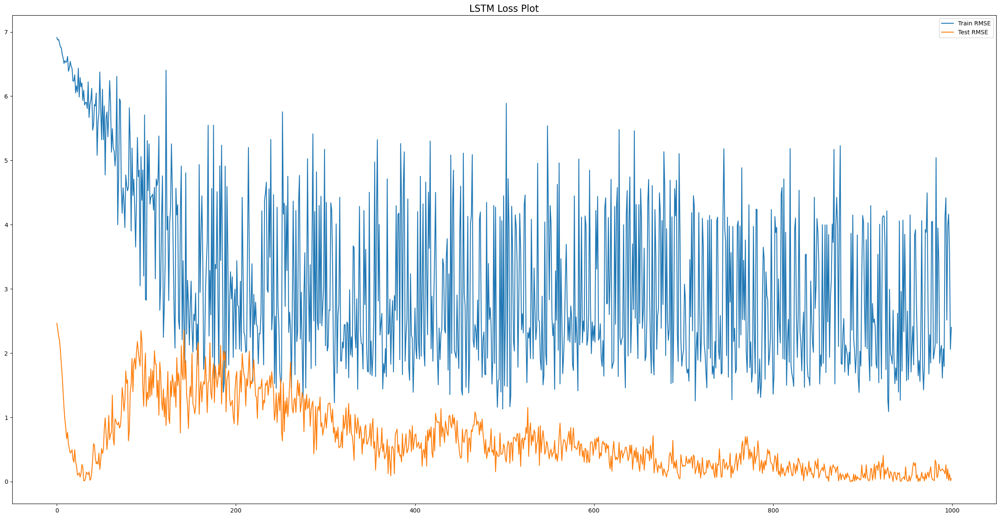

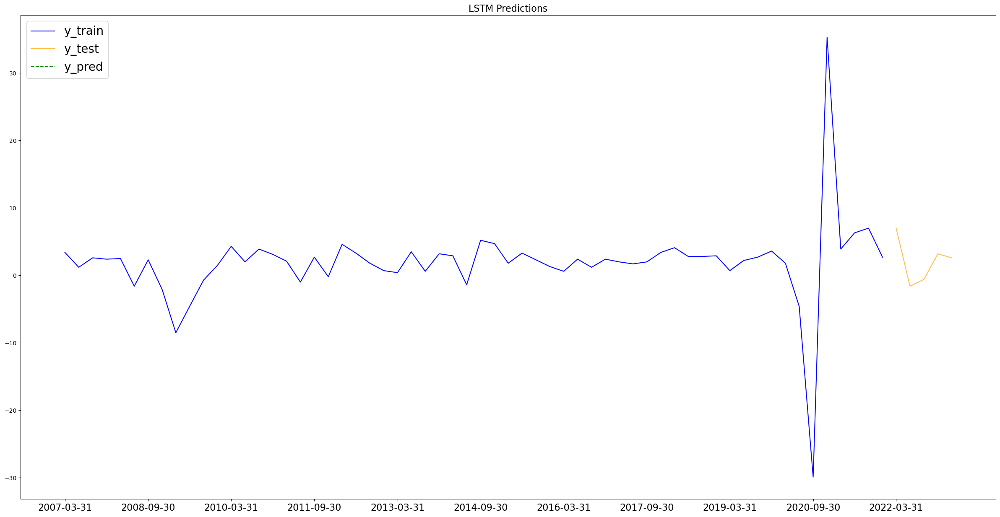

In [71]:
lstm_results = zm.lstm(all_features_2006_q_diff, 'gdp_q_shift', X_train, X_test, y_train, y_test, length=4, batch_size=2, features=11, epoch=1000, periods=1, steps=6)

The below are the better set of hyperparameter tuning set that got me better results in general.

Settings For Model:
- 2 LSTM Layers with 10 nodes in the first and 8 in the second
- 2 dense layers with relu activation with a dropout(0.5) layer in between
- 1 output layer with identity activation
- Adam optimiser (0.001)
- loss = mse, metrics = RMSE
- early stop with patience of 3

When tuning the hyperparameters, I note that the results are somwhat inconsistent even when the same settings was applied. There are moments where predictions were close to test values and there were moments when it wasnt. Therefore, my observations here will speak genereally of them. 

Further, I note that due to constraints on how Time Series Generator uses past data to train / predict on a future datapoint, the time periods that we will be using in this section to measure and observe LSTM's predictive abilities would be different from other models. With that said, predicted periods remain the same at 4 quarters.

As y_pred is not visually observable on the plot, we will observe its numerical prediction. On most occassions, LSTM was able to predict for direction well. However, there are moments when the model could not predict magnitude well as it may predict a value that appear inconsistent with y_test.

### Observing for LSTM 'Robustness'

In [84]:
# Train Test Split With All Features for a test period of next 1 Quarter 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, shuffle=False)

Epoch 1/20
22/22 [==============================] - 3s 31ms/step - loss: 8.8123 - root_mean_squared_error: 2.9686 - val_loss: 180.1840 - val_root_mean_squared_error: 13.4233
Epoch 2/20
22/22 [==============================] - 0s 5ms/step - loss: 8.6494 - root_mean_squared_error: 2.9410 - val_loss: 179.8566 - val_root_mean_squared_error: 13.4111
Epoch 3/20
22/22 [==============================] - 0s 11ms/step - loss: 8.3483 - root_mean_squared_error: 2.8893 - val_loss: 179.4659 - val_root_mean_squared_error: 13.3965
Epoch 4/20
22/22 [==============================] - 0s 6ms/step - loss: 8.0397 - root_mean_squared_error: 2.8354 - val_loss: 178.7935 - val_root_mean_squared_error: 13.3714
Epoch 5/20
22/22 [==============================] - 0s 5ms/step - loss: 7.8814 - root_mean_squared_error: 2.8074 - val_loss: 177.9254 - val_root_mean_squared_error: 13.3389
Epoch 6/20
22/22 [==============================] - 0s 5ms/step - loss: 7.5433 - root_mean_squared_error: 2.7465 - val_loss: 176.9783

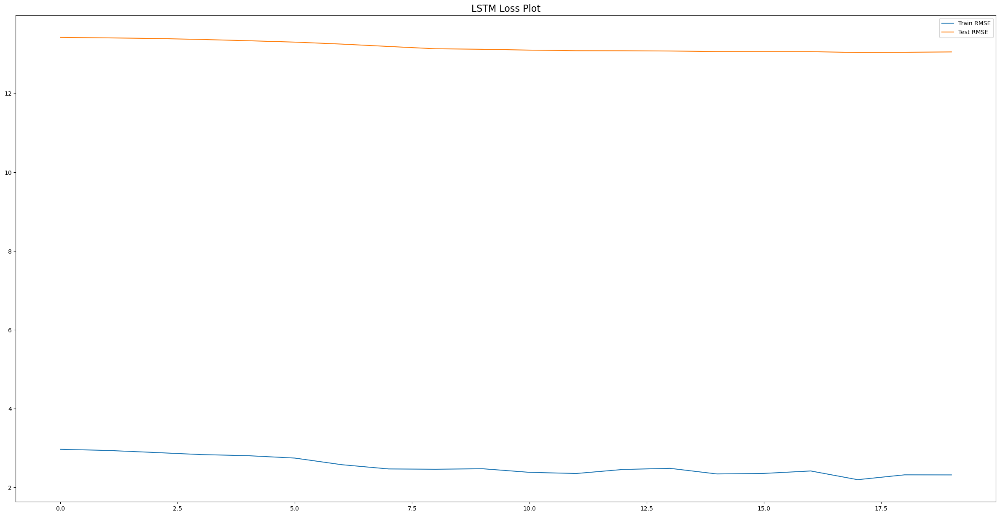

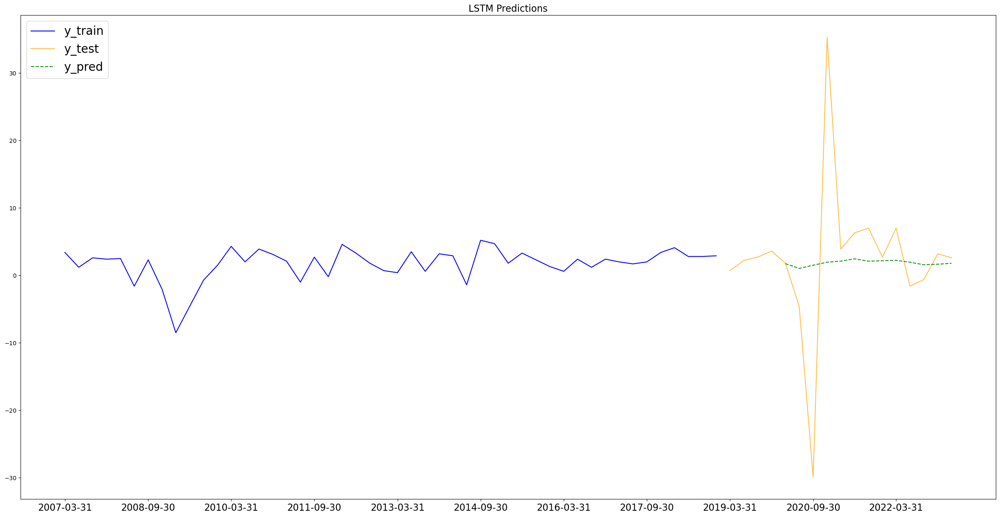

In [85]:
lstm_results = zm.lstm(all_features_2006_q_diff, 'gdp_q_shift', X_train, X_test, y_train, y_test, length=4, batch_size=2, features=11, epoch=20, periods=13, steps=6)

##### Observation

LSTM(All Features) appears is not robust enough to produce predictions over longer time periods, given this dataset. It appears that LSTM is unable to predict for magnitude and direction of quarterly gdp. 

The loss plot above seem to indicate that the model has overtrained on train data as the loss plots imply an overfit model to train data.

In summary, LSTM seem to perform relatively better when predicting over shorter time frames for quarterly gdp data with all features included.

##### Summary

|Model|Predicting for|Dataset|Variables|Train RMSE|Test RMSE|
|--|--|--|--|--|--|
|ARIMA (AIC) Baseline|Next 4 Quarters|2006(Q)|gdp_q|6.36|1.68|
|ARIMA (AIC) Baseline|Next 1 Quarter|2006(Q)|gdp_q|6.22|0.36|
|SARIMA (M=1)|Next 4 Quarters|2006(Q)|gdp_q|6.36|1.68|
|SARIMA (M=1)|Next 1 Quarter|2006(Q)|gdp_q|6.22|0.36|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|All Features|2.29|1.82|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|All Features|2.28|1.13|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|AC Features|3.07|1.15|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|AC Features|2.91|1.35|
|SARIMAX (M=1)|Next 1 Quarter1|2006(Q)|payrolls|6.50|0.30|
|Prophet|Next 4 Quarters|2006(Q)|gdp_q|5.82|2.41|
|Prophet|Next 1 Quarter|2006(Q)|gdp_q|5.70|0.75|
|BATS|Next 4 Quarters|2006(Q)|gdp_q|N.A|1.14|
|BATS|Next 1 Quarter|2006(Q)|gdp_q|N.A|0.87|
|TBATS|Next 4 Quarters|2006(Q)|gdp_q|N.A|1.14|
|TBATS|Next 1 Quarter|2006(Q)|gdp_q|N.A|0.87|
|Kalman Filter|Next 4 Quarters|2006(Q)|gdp_q|4.09|5.42|
|Kalman Filter|Next 1 Quarter|2006(Q)|gdp_q|4.01|0.82|
|LSTM|Next 4 Quarters|2006(Q)|All Features|2.14|1.19|
|LSTM|Next 1 Quarter|2006(Q)|All Features|2.04|0.05|

## LSTM Quarterly GDP (AC Features)

- Referring back to the EDA and the prior modelling notebook, I would be utilising oecd_cli_shift and non farm payrolls only as exogenous variables.

### LSTM Predicting 1 Year

In [86]:
# Declaring for X to be oecd and non farm payrolls
y = all_features_2006_q_diff['gdp_q_shift']
X = all_features_2006_q_diff[['oecd_cli_shift', 'non_farm_payrolls_diff']]

# Train Test Split With All Features for a test period of next 4 Quarters (1 Year)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.12, shuffle=False)

In [73]:
# Sequence check
zm.sequence_check(y_train, y_test)

Each split data head and tail will be printed in sequence of train head, train tail, test head, test tail
Period
2007-03-31    3.4
2007-06-30    1.2
2007-09-30    2.6
2007-12-31    2.4
2008-03-31    2.5
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64
Period
2020-03-31     1.8
2020-06-30    -4.6
2020-09-30   -29.9
2020-12-31    35.3
2021-03-31     3.9
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64
Period
2021-06-30    6.3
2021-09-30    7.0
2021-12-31    2.7
2022-03-31    7.0
2022-06-30   -1.6
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64
Period
2022-03-31    7.0
2022-06-30   -1.6
2022-09-30   -0.6
2022-12-31    3.2
2023-03-31    2.6
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64


Epoch 1/1000
27/27 [==============================] - 4s 25ms/step - loss: 48.6040 - root_mean_squared_error: 6.9717 - val_loss: 4.6735 - val_root_mean_squared_error: 2.1618
Epoch 2/1000
27/27 [==============================] - 0s 5ms/step - loss: 48.2736 - root_mean_squared_error: 6.9479 - val_loss: 4.4769 - val_root_mean_squared_error: 2.1159
Epoch 3/1000
27/27 [==============================] - 0s 5ms/step - loss: 47.3417 - root_mean_squared_error: 6.8805 - val_loss: 4.3598 - val_root_mean_squared_error: 2.0880
Epoch 4/1000
27/27 [==============================] - 0s 5ms/step - loss: 47.4133 - root_mean_squared_error: 6.8857 - val_loss: 4.2726 - val_root_mean_squared_error: 2.0670
Epoch 5/1000
27/27 [==============================] - 0s 5ms/step - loss: 47.0150 - root_mean_squared_error: 6.8567 - val_loss: 4.2753 - val_root_mean_squared_error: 2.0677
Epoch 6/1000
27/27 [==============================] - 0s 5ms/step - loss: 45.8098 - root_mean_squared_error: 6.7683 - val_loss: 4.3264

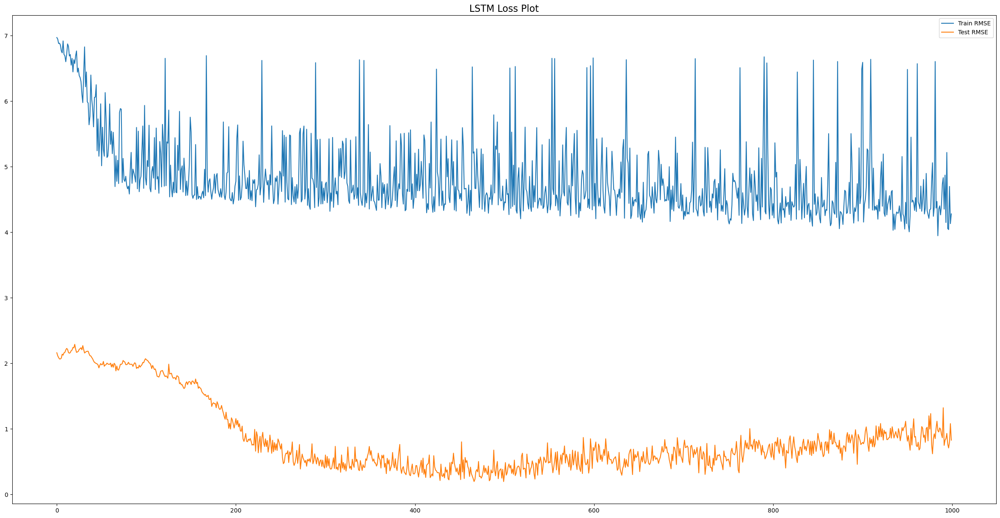

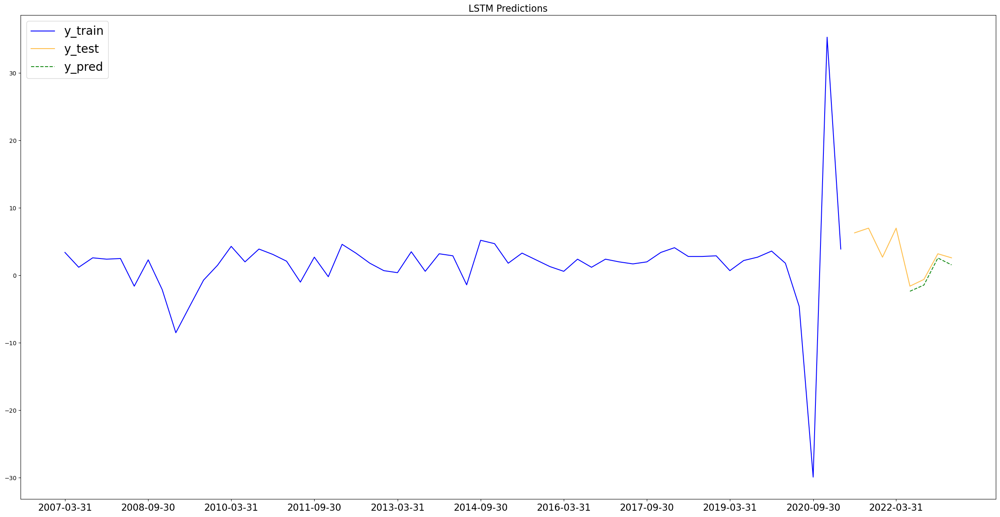

In [74]:
lstm_results = zm.lstm(all_features_2006_q_diff, 'gdp_q_shift', X_train, X_test, y_train, y_test, length=4, batch_size=2, features=2, epoch=1000, periods=4, steps=6)

##### Observations

The below are the better set of hyperparameter tuning set that got me better results in general.

Settings For Model:
- 2 LSTM Layers with 10 nodes in the first and 8 in the second
- 2 dense layers with relu activation with a dropout(0.5) layer in between
- 1 output layer with identity activation
- Adam optimiser (0.001)
- loss = mse, metrics = RMSE
- early_stop with patience of 3

I note that due to constraints on how Time Series Generator uses past data to train / predict on a future datapoint, the time periods that we will be using in this section to measure and observe LSTM's predictive abilities would be different from other models. With that said, predicted periods remain the same at 4 quarters.

Here, we can observe that LSTM(AC Features) has produced predictions that were directionally correct with magnitude somewhat representative of y_test as it produced slightly amplified predictions.

### LSTM Predicting 1 Quarter

In [75]:
# Train Test Split With All Features for a test period of next 1 Quarter 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.07, shuffle=False)

In [76]:
# Sequence check
zm.sequence_check(y_train, y_test)

Each split data head and tail will be printed in sequence of train head, train tail, test head, test tail
Period
2007-03-31    3.4
2007-06-30    1.2
2007-09-30    2.6
2007-12-31    2.4
2008-03-31    2.5
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64
Period
2020-12-31    35.3
2021-03-31     3.9
2021-06-30     6.3
2021-09-30     7.0
2021-12-31     2.7
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64
Period
2022-03-31    7.0
2022-06-30   -1.6
2022-09-30   -0.6
2022-12-31    3.2
2023-03-31    2.6
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64
Period
2022-03-31    7.0
2022-06-30   -1.6
2022-09-30   -0.6
2022-12-31    3.2
2023-03-31    2.6
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64


Epoch 1/1000
28/28 [==============================] - 4s 26ms/step - loss: 47.9929 - root_mean_squared_error: 6.9277 - val_loss: 6.4417 - val_root_mean_squared_error: 2.5380
Epoch 2/1000
28/28 [==============================] - 0s 5ms/step - loss: 47.7636 - root_mean_squared_error: 6.9111 - val_loss: 6.1041 - val_root_mean_squared_error: 2.4706
Epoch 3/1000
28/28 [==============================] - 0s 5ms/step - loss: 47.6042 - root_mean_squared_error: 6.8996 - val_loss: 5.7306 - val_root_mean_squared_error: 2.3939
Epoch 4/1000
28/28 [==============================] - 0s 5ms/step - loss: 47.5605 - root_mean_squared_error: 6.8964 - val_loss: 5.2672 - val_root_mean_squared_error: 2.2950
Epoch 5/1000
28/28 [==============================] - 0s 5ms/step - loss: 46.6758 - root_mean_squared_error: 6.8320 - val_loss: 4.9387 - val_root_mean_squared_error: 2.2223
Epoch 6/1000
28/28 [==============================] - 0s 5ms/step - loss: 46.6209 - root_mean_squared_error: 6.8279 - val_loss: 4.5218

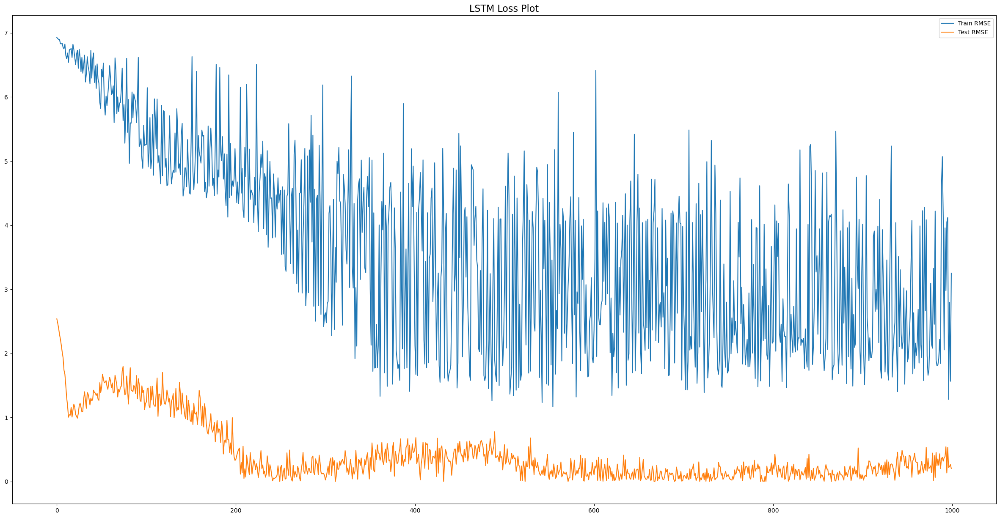

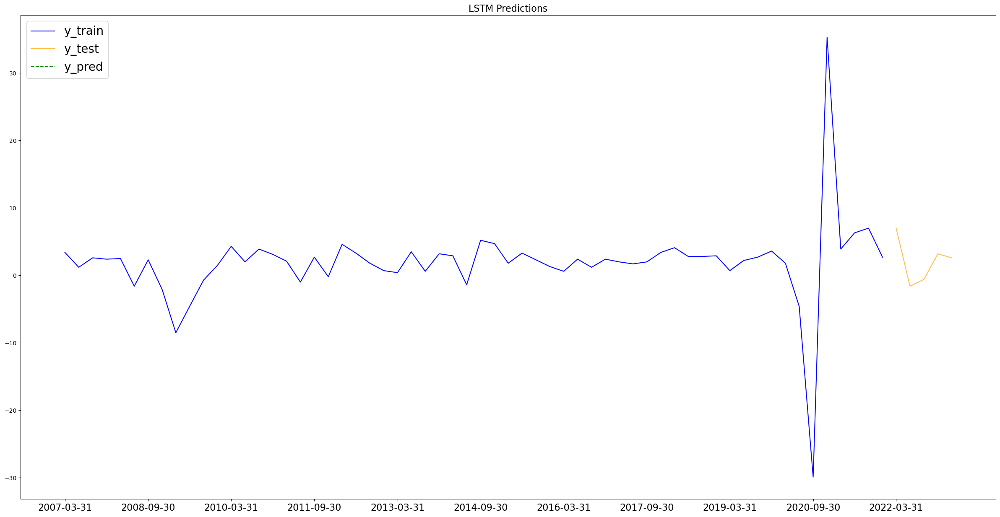

In [79]:
lstm_results = zm.lstm(all_features_2006_q_diff, 'gdp_q_shift', X_train, X_test, y_train, y_test, length=4, batch_size=2, features=2, epoch=1000, periods=1, steps=6)

The below are the better set of hyperparameter tuning set that got me better results in general.

Settings For Model:
- 2 LSTM Layers with 10 nodes in the first and 8 in the second
- 2 dense layers with relu activation with a dropout(0.5) layer in between
- 1 output layer with identity activation
- Adam optimiser (0.001)
- loss = mse, metrics = RMSE
- early stop with patience of 3

When tuning the hyperparameters, I note that the results are somwhat inconsistent even when the same settings was applied. There are moments where predictions were close to test values and there were moments when it wasnt. Therefore, my observations here will speak genereally of them. 

Further, I note that due to constraints on how Time Series Generator uses past data to train / predict on a future datapoint, the time periods that we will be using in this section to measure and observe LSTM's predictive abilities would be different from other models. With that said, predicted periods remain the same at 4 quarters.

As y_pred is not visually observable on the plot, we will observe its numerical prediction. On most occassions, LSTM was able to predict for direction well. However, there are moments when the model could not predict magnitude well as it may predict a value that appear inconsistent with y_test.

### Observing for LSTM (AC Features) 'Robustness'

In [87]:
# Train Test Split With All Features for a test period of next 1 Quarter 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, shuffle=False)

Epoch 1/20
22/22 [==============================] - 3s 31ms/step - loss: 8.8387 - root_mean_squared_error: 2.9730 - val_loss: 180.2525 - val_root_mean_squared_error: 13.4258
Epoch 2/20
22/22 [==============================] - 0s 5ms/step - loss: 8.7512 - root_mean_squared_error: 2.9582 - val_loss: 180.0880 - val_root_mean_squared_error: 13.4197
Epoch 3/20
22/22 [==============================] - 0s 10ms/step - loss: 8.6476 - root_mean_squared_error: 2.9407 - val_loss: 179.9219 - val_root_mean_squared_error: 13.4135
Epoch 4/20
22/22 [==============================] - 0s 5ms/step - loss: 8.5452 - root_mean_squared_error: 2.9232 - val_loss: 179.7398 - val_root_mean_squared_error: 13.4067
Epoch 5/20
22/22 [==============================] - 0s 7ms/step - loss: 8.4374 - root_mean_squared_error: 2.9047 - val_loss: 179.5274 - val_root_mean_squared_error: 13.3988
Epoch 6/20
22/22 [==============================] - 0s 5ms/step - loss: 8.3448 - root_mean_squared_error: 2.8887 - val_loss: 179.3062

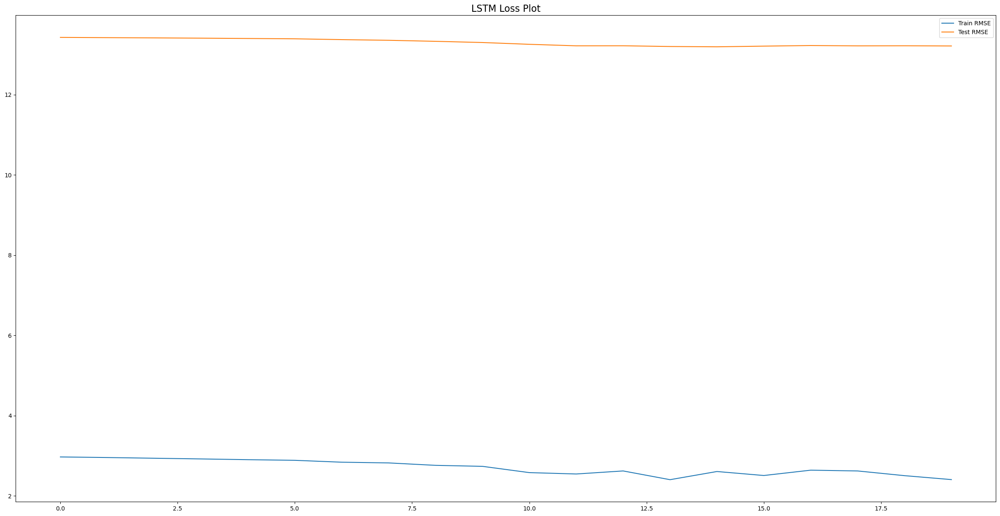

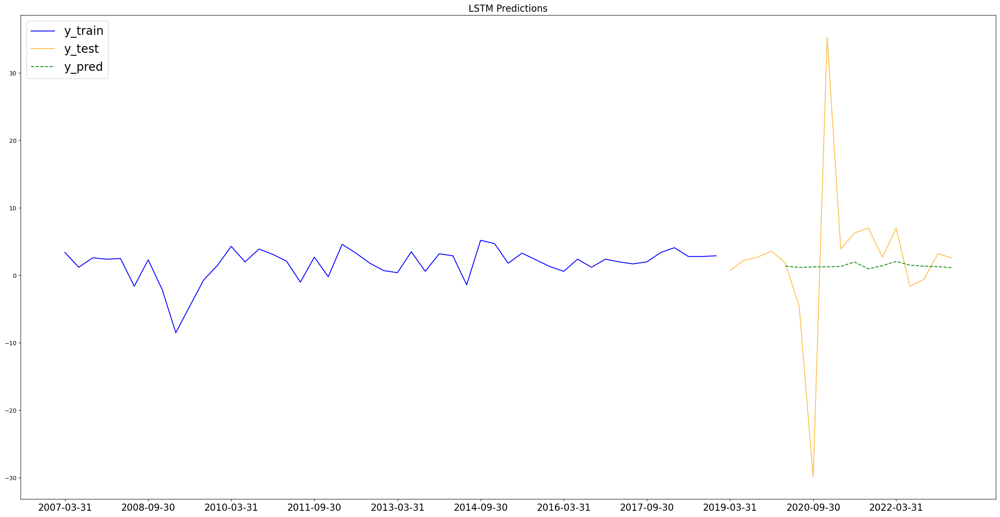

In [88]:
lstm_results = zm.lstm(all_features_2006_q_diff, 'gdp_q_shift', X_train, X_test, y_train, y_test, length=4, batch_size=2, features=2, epoch=20, periods=13, steps=6)

##### Observation

LSTM appears is not robust enough to produce predictions over longer time periods, given this dataset. It appears that LSTM is unable to predict for magnitude and direction of quarterly gdp. 

The loss plot above seem to indicate that the model has overtrained on train data as the loss plots imply an overfit model to train data.

In summary, LSTM seem to perform relatively better when predicting over shorter time frames for quarterly gdp data with all features included.

##### Summary

|Model|Predicting for|Dataset|Variables|Train RMSE|Test RMSE|
|--|--|--|--|--|--|
|ARIMA (AIC) Baseline|Next 4 Quarters|2006(Q)|gdp_q|6.36|1.68|
|ARIMA (AIC) Baseline|Next 1 Quarter|2006(Q)|gdp_q|6.22|0.36|
|SARIMA (M=1)|Next 4 Quarters|2006(Q)|gdp_q|6.36|1.68|
|SARIMA (M=1)|Next 1 Quarter|2006(Q)|gdp_q|6.22|0.36|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|All Features|2.29|1.82|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|All Features|2.28|1.13|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|AC Features|3.07|1.15|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|AC Features|2.91|1.35|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|payrolls|6.50|0.30|
|Prophet|Next 4 Quarters|2006(Q)|gdp_q|5.82|2.41|
|Prophet|Next 1 Quarter|2006(Q)|gdp_q|5.70|0.75|
|BATS|Next 4 Quarters|2006(Q)|gdp_q|N.A|1.14|
|BATS|Next 1 Quarter|2006(Q)|gdp_q|N.A|0.87|
|TBATS|Next 4 Quarters|2006(Q)|gdp_q|N.A|1.14|
|TBATS|Next 1 Quarter|2006(Q)|gdp_q|N.A|0.87|
|Kalman Filter|Next 4 Quarters|2006(Q)|gdp_q|4.09|5.42|
|Kalman Filter|Next 1 Quarter|2006(Q)|gdp_q|4.01|0.82|
|LSTM|Next 4 Quarters|2006(Q)|All Features|2.14|1.19|
|LSTM|Next 1 Quarter|2006(Q)|All Features|2.04|0.05|
|LSTM|Next 4 Quarters|2006(Q)|AC Features|4.28|0.83|
|LSTM|Next 1 Quarter|2006(Q)|AC Features|3.25|0.20|

### LSTM Predicting 1 Quarter (Best Feature)

In [89]:
# Declaring for X to be oecd and non farm payrolls
y = all_features_2006_q_diff['gdp_q_shift']
X = all_features_2006_q_diff[['payrolls']]

# Train Test Split With All Features for a test period of next 4 Quarters (1 Year)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.07, shuffle=False)

In [90]:
# Sequence check
zm.sequence_check(y_train, y_test)

Each split data head and tail will be printed in sequence of train head, train tail, test head, test tail
Period
2007-03-31    3.4
2007-06-30    1.2
2007-09-30    2.6
2007-12-31    2.4
2008-03-31    2.5
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64
Period
2020-12-31    35.3
2021-03-31     3.9
2021-06-30     6.3
2021-09-30     7.0
2021-12-31     2.7
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64
Period
2022-03-31    7.0
2022-06-30   -1.6
2022-09-30   -0.6
2022-12-31    3.2
2023-03-31    2.6
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64
Period
2022-03-31    7.0
2022-06-30   -1.6
2022-09-30   -0.6
2022-12-31    3.2
2023-03-31    2.6
Freq: Q-DEC, Name: gdp_q_shift, dtype: float64


Epoch 1/1000
28/28 [==============================] - 3s 26ms/step - loss: 47.9619 - root_mean_squared_error: 6.9255 - val_loss: 6.4038 - val_root_mean_squared_error: 2.5306
Epoch 2/1000
28/28 [==============================] - 0s 5ms/step - loss: 47.6920 - root_mean_squared_error: 6.9059 - val_loss: 6.0214 - val_root_mean_squared_error: 2.4539
Epoch 3/1000
28/28 [==============================] - 0s 5ms/step - loss: 47.3251 - root_mean_squared_error: 6.8793 - val_loss: 5.5977 - val_root_mean_squared_error: 2.3659
Epoch 4/1000
28/28 [==============================] - 0s 4ms/step - loss: 47.0311 - root_mean_squared_error: 6.8579 - val_loss: 4.9129 - val_root_mean_squared_error: 2.2165
Epoch 5/1000
28/28 [==============================] - 0s 4ms/step - loss: 46.1534 - root_mean_squared_error: 6.7936 - val_loss: 3.7558 - val_root_mean_squared_error: 1.9380
Epoch 6/1000
28/28 [==============================] - 0s 4ms/step - loss: 46.3118 - root_mean_squared_error: 6.8053 - val_loss: 2.4140

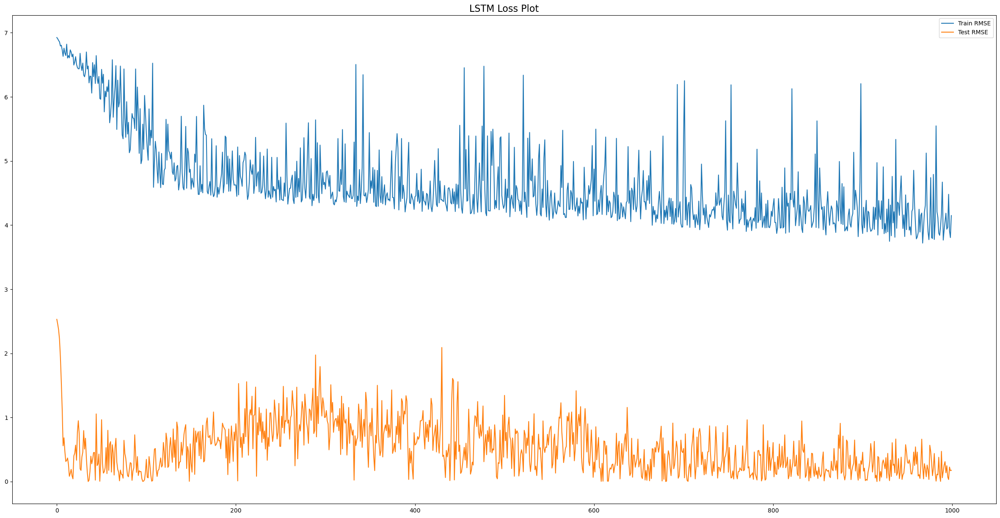

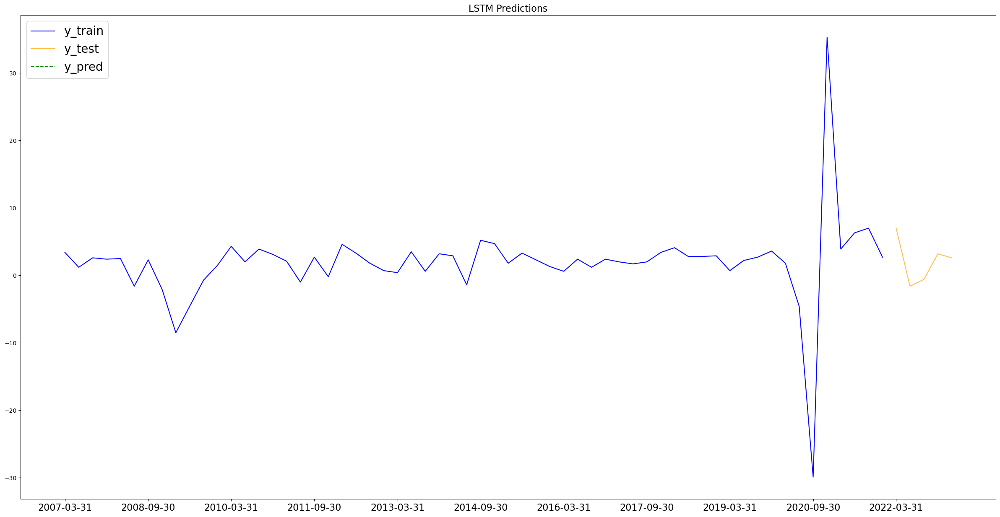

In [92]:
lstm_results = zm.lstm(all_features_2006_q_diff, 'gdp_q_shift', X_train, X_test, y_train, y_test, length=4, batch_size=2, features=1, epoch=1000, periods=1, steps=6)

##### Observation 

We can observe that LSTM (Best Feature) produced one of the best train RMSE and test RMSE values among all the models when predicting for the next 1 quarter using quarterly gdp data.

##### Summary

|Model|Predicting for|Dataset|Variables|Train RMSE|Test RMSE|
|--|--|--|--|--|--|
|ARIMA (AIC) Baseline|Next 4 Quarters|2006(Q)|gdp_q|6.36|1.68|
|ARIMA (AIC) Baseline|Next 1 Quarter|2006(Q)|gdp_q|6.22|0.36|
|SARIMA (M=1)|Next 4 Quarters|2006(Q)|gdp_q|6.36|1.68|
|SARIMA (M=1)|Next 1 Quarter|2006(Q)|gdp_q|6.22|0.36|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|All Features|2.29|1.82|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|All Features|2.28|1.13|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|AC Features|3.07|1.15|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|AC Features|2.91|1.35|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|payrolls|6.50|0.30|
|Prophet|Next 4 Quarters|2006(Q)|gdp_q|5.82|2.41|
|Prophet|Next 1 Quarter|2006(Q)|gdp_q|5.70|0.75|
|BATS|Next 4 Quarters|2006(Q)|gdp_q|N.A|1.14|
|BATS|Next 1 Quarter|2006(Q)|gdp_q|N.A|0.87|
|TBATS|Next 4 Quarters|2006(Q)|gdp_q|N.A|1.14|
|TBATS|Next 1 Quarter|2006(Q)|gdp_q|N.A|0.87|
|Kalman Filter|Next 4 Quarters|2006(Q)|gdp_q|4.09|5.42|
|Kalman Filter|Next 1 Quarter|2006(Q)|gdp_q|4.01|0.82|
|LSTM|Next 4 Quarters|2006(Q)|All Features|2.14|1.19|
|LSTM|Next 1 Quarter|2006(Q)|All Features|2.04|0.05|
|LSTM|Next 4 Quarters|2006(Q)|AC Features|4.28|0.83|
|LSTM|Next 1 Quarter|2006(Q)|AC Features|3.25|0.20|
|LSTM|Next 1 Quarter|2006(Q)|payrolls|4.15|0.18|

I note that LSTM performs somewhat similarly to SARIMAX (M=1) when using similar dataframes.

## LSTM Monthly GDP (All Features)

### LSTM Predicting 1 Year

In [93]:
# Modifying dataframe due to time series generator & LSTM prediction characteristics and constraints
all_features_2006_m['real_gdp_m_shift'] = all_features_2006_m['real_gdp_m'].shift(1)
all_features_2006_m = all_features_2006_m.dropna()

# Inspect
all_features_2006_m.head()

,non_farm_payrolls,total_industrial_production,pce,export_growth_rate,oecd_cli,consumer_sentiment,retail_sales,import_growth_rate,manufacturers_new_orders,payrolls,hours,real_gdp_m,real_gdp_m_shift
Period,,,,,,,,,,,,,
2006-06-01,0.1,0.341927,0.1,2.173939,-0.033236,7.332491,0.3,0.296817,0.937016,0.9,0.4,-0.134519,0.438541
2006-07-01,0.1,-0.062902,0.6,-2.434284,-0.028485,-0.235571,0.3,0.436403,-2.477775,0.1,-0.2,-0.282508,-0.134519
2006-08-01,0.1,0.434632,-0.3,2.830614,-0.010841,-3.187721,0.5,1.984637,0.458199,0.3,0.1,0.384187,-0.282508
2006-09-01,0.1,-0.191026,0.6,0.916796,0.012797,4.146341,-0.5,-1.000225,4.063674,0.8,0.3,0.364867,0.384187
2006-10-01,0.0,-0.096149,0.4,0.861616,0.030535,9.601874,-0.1,-2.154420,-4.584465,-0.2,-0.3,0.059721,0.364867


In [123]:
# Declaring for X to be all other features
y = all_features_2006_m['real_gdp_m_shift']
X = all_features_2006_m.drop(columns=['real_gdp_m', 'real_gdp_m_shift'])

# Train Test Split With All Features for a test period of next 12 months (1 Year)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.117, shuffle=False)

In [124]:
# Sequence check
zm.sequence_check(y_train, y_test)

Each split data head and tail will be printed in sequence of train head, train tail, test head, test tail
Period
2006-06-01    0.438541
2006-07-01   -0.134519
2006-08-01   -0.282508
2006-09-01    0.384187
2006-10-01    0.364867
Name: real_gdp_m_shift, dtype: float64
Period
2021-01-01    0.089258
2021-02-01    1.917762
2021-03-01   -1.243952
2021-04-01    2.403917
2021-05-01    0.059266
Name: real_gdp_m_shift, dtype: float64
Period
2021-06-01    0.641190
2021-07-01    0.135162
2021-08-01   -0.238832
2021-09-01    0.673561
2021-10-01    0.429033
Name: real_gdp_m_shift, dtype: float64
Period
2023-01-01   -0.154016
2023-02-01    0.665956
2023-03-01   -0.269493
2023-04-01   -0.058559
2023-05-01    0.197209
Name: real_gdp_m_shift, dtype: float64


Epoch 1/500
28/28 [==============================] - 3s 29ms/step - loss: 1.3663 - root_mean_squared_error: 1.1689 - val_loss: 0.2439 - val_root_mean_squared_error: 0.4939
Epoch 2/500
28/28 [==============================] - 0s 7ms/step - loss: 1.4119 - root_mean_squared_error: 1.1882 - val_loss: 0.2398 - val_root_mean_squared_error: 0.4897
Epoch 3/500
28/28 [==============================] - 0s 11ms/step - loss: 1.3721 - root_mean_squared_error: 1.1714 - val_loss: 0.2383 - val_root_mean_squared_error: 0.4882
Epoch 4/500
28/28 [==============================] - 0s 8ms/step - loss: 1.3797 - root_mean_squared_error: 1.1746 - val_loss: 0.2370 - val_root_mean_squared_error: 0.4869
Epoch 5/500
28/28 [==============================] - 0s 8ms/step - loss: 1.4036 - root_mean_squared_error: 1.1847 - val_loss: 0.2373 - val_root_mean_squared_error: 0.4871
Epoch 6/500
28/28 [==============================] - 0s 7ms/step - loss: 1.3691 - root_mean_squared_error: 1.1701 - val_loss: 0.2407 - val_root

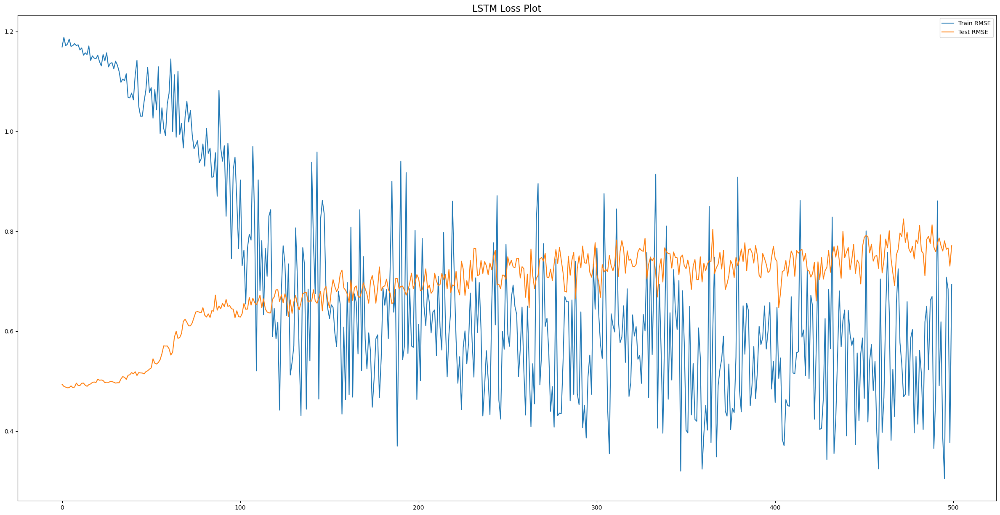

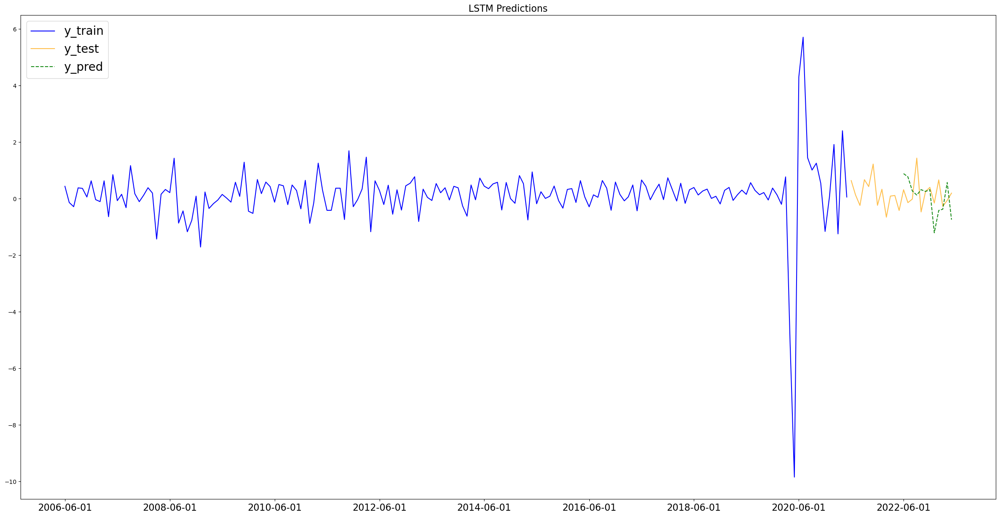

In [130]:
lstm_results = zm.lstm(all_features_2006_m, 'real_gdp_m_shift', X_train, X_test, y_train, y_test, length=12, batch_size=6, features=11, epoch=500, periods=12, steps=24)

##### Observations

The below are the better set of hyperparameter tuning set that got me better results in general.

Settings For Model:
- 2 LSTM Layers with 10 nodes in the first and 8 in the second
- 2 dense layers with relu activation with a dropout(0.5) layer in between
- 1 output layer with identity activation
- Adam optimiser (0.001)
- loss = mse, metrics = RMSE
- early_stop with patience of 3

When tuning the hyperparameters, I note that the results are somwhat inconsistent even when the same settings was applied. There are moments where predictions were close to test values and there were moments when it wasnt. Therefore, my observations here will speak genereally of them. 

Further, I note that due to constraints on how Time Series Generator uses past data to train / predict on a future datapoint, the time periods that we will be using in this section to measure and observe LSTM's predictive abilities would be different from other models. With that said, predicted periods remain the same at 4 quarters.

On most occassions, LSTM was not able to predict for direction and magnitude of monthly gdp well.

### LSTM Predicting 1 Quarter

In [131]:
# Train Test Split With All Features for a test period of next quarter (3 months)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.07, shuffle=False)

In [132]:
# Sequence check
zm.sequence_check(y_train, y_test)

Each split data head and tail will be printed in sequence of train head, train tail, test head, test tail
Period
2006-06-01    0.438541
2006-07-01   -0.134519
2006-08-01   -0.282508
2006-09-01    0.384187
2006-10-01    0.364867
Name: real_gdp_m_shift, dtype: float64
Period
2021-10-01    0.429033
2021-11-01    1.225526
2021-12-01   -0.234004
2022-01-01    0.334765
2022-02-01   -0.653660
Name: real_gdp_m_shift, dtype: float64
Period
2022-03-01    0.092693
2022-04-01    0.114250
2022-05-01   -0.416991
2022-06-01    0.318740
2022-07-01   -0.139146
Name: real_gdp_m_shift, dtype: float64
Period
2023-01-01   -0.154016
2023-02-01    0.665956
2023-03-01   -0.269493
2023-04-01   -0.058559
2023-05-01    0.197209
Name: real_gdp_m_shift, dtype: float64


Epoch 1/1000
30/30 [==============================] - 4s 27ms/step - loss: 1.3573 - root_mean_squared_error: 1.1650 - val_loss: 0.0413 - val_root_mean_squared_error: 0.2033
Epoch 2/1000
30/30 [==============================] - 0s 7ms/step - loss: 1.3426 - root_mean_squared_error: 1.1587 - val_loss: 0.0426 - val_root_mean_squared_error: 0.2063
Epoch 3/1000
30/30 [==============================] - 0s 7ms/step - loss: 1.3319 - root_mean_squared_error: 1.1541 - val_loss: 0.0439 - val_root_mean_squared_error: 0.2095
Epoch 4/1000
30/30 [==============================] - 0s 7ms/step - loss: 1.3325 - root_mean_squared_error: 1.1543 - val_loss: 0.0442 - val_root_mean_squared_error: 0.2103
Epoch 5/1000
30/30 [==============================] - 0s 10ms/step - loss: 1.3243 - root_mean_squared_error: 1.1508 - val_loss: 0.0450 - val_root_mean_squared_error: 0.2122
Epoch 6/1000
30/30 [==============================] - 0s 8ms/step - loss: 1.3333 - root_mean_squared_error: 1.1547 - val_loss: 0.0468 - va

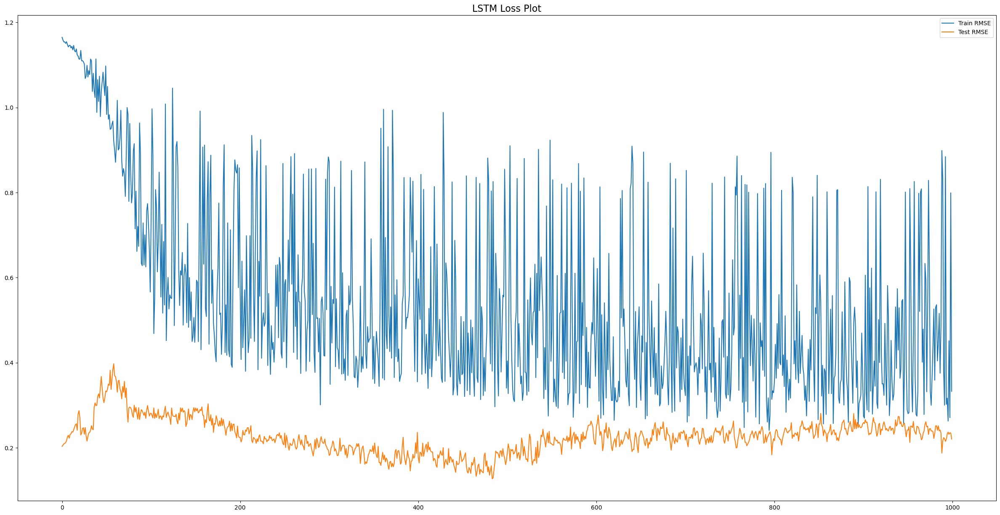

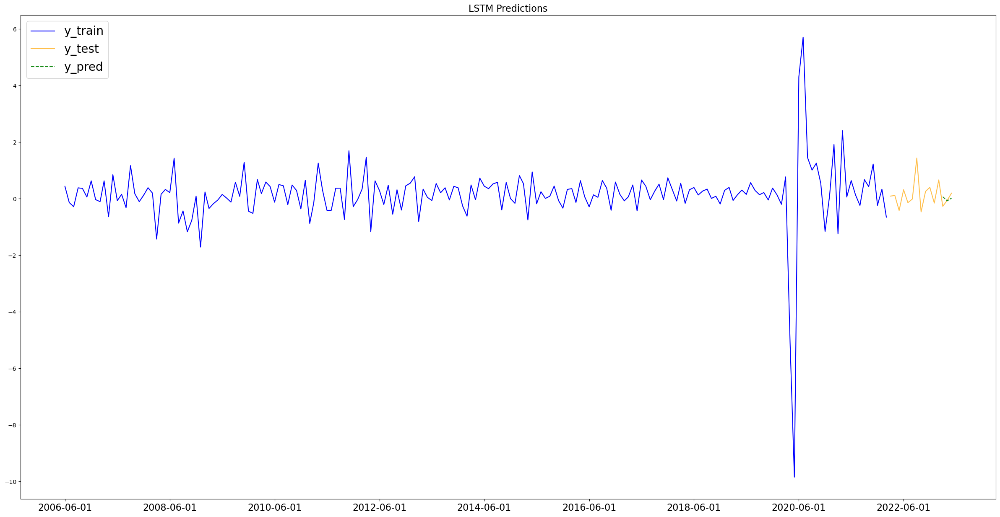

In [133]:
lstm_results = zm.lstm(all_features_2006_m, 'real_gdp_m_shift', X_train, X_test, y_train, y_test, length=12, batch_size=6, features=11, epoch=1000, periods=3, steps=24)

##### Observations

The below are the better set of hyperparameter tuning set that got me better results in general.

Settings For Model:
- 2 LSTM Layers with 10 nodes in the first and 8 in the second
- 2 dense layers with relu activation with a dropout(0.5) layer in between
- 1 output layer with identity activation
- Adam optimiser (0.001)
- loss = mse, metrics = RMSE
- early_stop with patience of 3

When tuning the hyperparameters, I note that the results are somwhat inconsistent even when the same settings was applied. There are moments where predictions were close to test values and there were moments when it wasnt. Therefore, my observations here will speak genereally of them. 

Further, I note that due to constraints on how Time Series Generator uses past data to train / predict on a future datapoint, the time periods that we will be using in this section to measure and observe LSTM's predictive abilities would be different from other models. With that said, predicted periods remain the same at 4 quarters.

We can observe that LSTM (All features) is able to predict for direction somewhat ok for the next quarter's monthly gdp prints. It's predicted magnitude was consistent on most periods (2/3 of observations).

##### Summary

|Model|Predicting for|Dataset|Variables|Train RMSE|Test RMSE|
|--|--|--|--|--|--|
|ARIMA (AIC) Baseline|Next 12 Months|2006(M)|real_gdp_m|1.11|0.51|
|ARIMA (AIC) Baseline|Next 3 Months|2006(M)|real_gdp_m|1.09|0.25|
|SARIMA (M=2)|Next 12 Months|2006(M)|real_gdp_m|1.11|0.51|
|SARIMA (M=2)|Next 3 Months|2006(M)|real_gdp_m|1.09|0.25|
|SARIMAX (M=2)|Next 12 Months|2006(M)|All Features|0.42|0.53|
|SARIMAX (M=2)|Next 3 Months|2006(M)|All Features|0.43|0.40|
|SARIMAX (M=2)|Next 12 Months|2006(M)|All Features|0.49|0.52|
|SARIMAX (M=2)|Next 3 Months|2006(M)|All Features|0.48|0.37|
|Prophet|Next 12 Months|2006(M)|real_gdp_m|1.02|0.54|
|Prophet|Next 3 Months|2006(M)|real_gdp_m|1.00|0.56|
|BATS|Next 12 Months|2006(M)|real_gdp_m|N.A|0.52|
|BATS|Next 3 Months|2006(M)|real_gdp_m|N.A|0.27|
|TBATS|Next 12 Months|2006(M)|real_gdp_m|N.A|0.52|
|TBATS|Next 3 Months|2006(M)|real_gdp_m|N.A|0.27|
|Kalman Filter|Next 12 Months|2006(M)|real_gdp_m|0.69|0.50|
|Kalman Filter|Next 3 Months|2006(M)|real_gdp_m|0.68|0.66|
|LSTM|Next 12 Months|2006(M)|All Features|0.69|0.77|
|LSTM|Next 3 Months|2006(M)|All Features|0.33|0.22|

## LSTM Monthly GDP (AC Features)

### LSTM Predicting 1 Year

In [100]:
# Declaring y and X
y = all_features_2006_m['real_gdp_m_shift']
X = all_features_2006_m[['non_farm_payrolls', 'total_industrial_production', 'pce']]

# Train Test Split With All Features for test period of 1 Year
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.117, shuffle=False)

In [101]:
# Sequence check
zm.sequence_check(y_train, y_test)

Each split data head and tail will be printed in sequence of train head, train tail, test head, test tail
Period
2006-06-01    0.438541
2006-07-01   -0.134519
2006-08-01   -0.282508
2006-09-01    0.384187
2006-10-01    0.364867
Name: real_gdp_m_shift, dtype: float64
Period
2021-01-01    0.089258
2021-02-01    1.917762
2021-03-01   -1.243952
2021-04-01    2.403917
2021-05-01    0.059266
Name: real_gdp_m_shift, dtype: float64
Period
2021-06-01    0.641190
2021-07-01    0.135162
2021-08-01   -0.238832
2021-09-01    0.673561
2021-10-01    0.429033
Name: real_gdp_m_shift, dtype: float64
Period
2023-01-01   -0.154016
2023-02-01    0.665956
2023-03-01   -0.269493
2023-04-01   -0.058559
2023-05-01    0.197209
Name: real_gdp_m_shift, dtype: float64


Epoch 1/1000
28/28 [==============================] - 5s 27ms/step - loss: 1.3979 - root_mean_squared_error: 1.1823 - val_loss: 0.2396 - val_root_mean_squared_error: 0.4895
Epoch 2/1000
28/28 [==============================] - 0s 7ms/step - loss: 1.3646 - root_mean_squared_error: 1.1682 - val_loss: 0.2347 - val_root_mean_squared_error: 0.4844
Epoch 3/1000
28/28 [==============================] - 0s 7ms/step - loss: 1.3923 - root_mean_squared_error: 1.1800 - val_loss: 0.2346 - val_root_mean_squared_error: 0.4843
Epoch 4/1000
28/28 [==============================] - 0s 7ms/step - loss: 1.4034 - root_mean_squared_error: 1.1847 - val_loss: 0.2410 - val_root_mean_squared_error: 0.4909
Epoch 5/1000
28/28 [==============================] - 0s 7ms/step - loss: 1.3472 - root_mean_squared_error: 1.1607 - val_loss: 0.2366 - val_root_mean_squared_error: 0.4865
Epoch 6/1000
28/28 [==============================] - 0s 7ms/step - loss: 1.3573 - root_mean_squared_error: 1.1650 - val_loss: 0.2366 - val

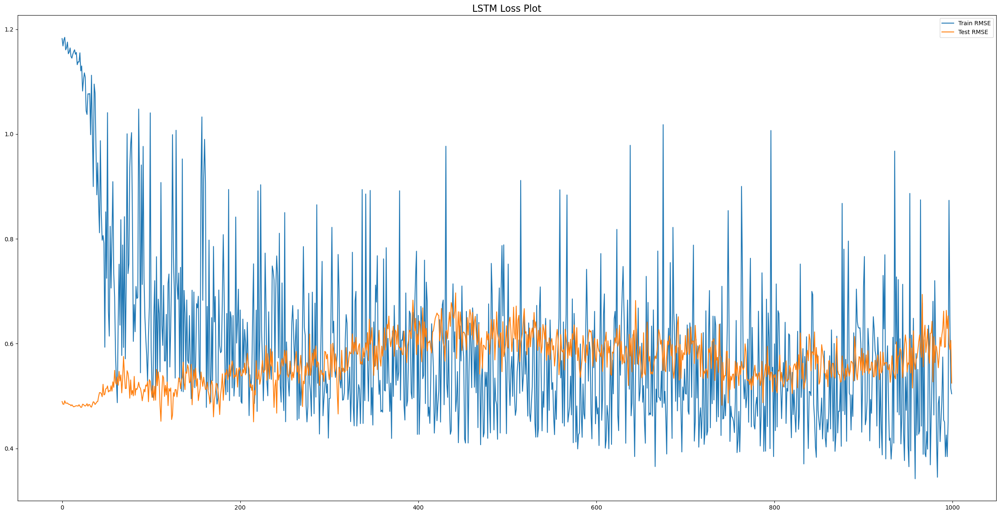

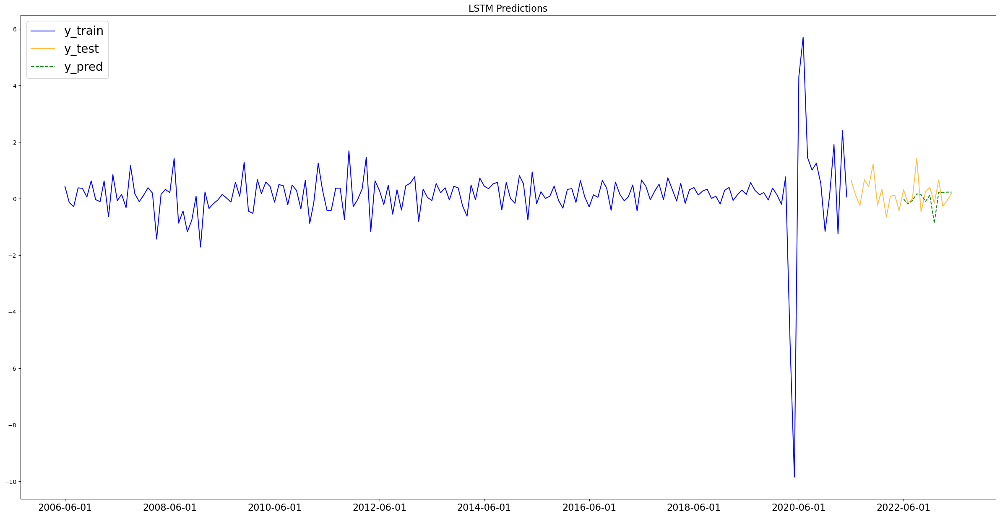

In [102]:
lstm_results = zm.lstm(all_features_2006_m, 'real_gdp_m_shift', X_train, X_test, y_train, y_test, length=12, batch_size=6, features=3, epoch=1000, periods=12, steps=24)

##### Observations

The below are the better set of hyperparameter tuning set that got me better results in general.

Settings For Model:
- 2 LSTM Layers with 10 nodes in the first and 8 in the second
- 2 dense layers with relu activation with a dropout(0.5) layer in between
- 1 output layer with identity activation
- Adam optimiser (0.001)
- loss = mse, metrics = RMSE
- early_stop with patience of 3

When tuning the hyperparameters, I note that the results are somwhat inconsistent even when the same settings was applied. There are moments where predictions were close to test values and there were moments when it wasnt. Therefore, my observations here will speak genereally of them. 

Further, I note that due to constraints on how Time Series Generator uses past data to train / predict on a future datapoint, the time periods that we will be using in this section to measure and observe LSTM's predictive abilities would be different from other models. With that said, predicted periods remain the same at 4 quarters.

On most occassions, LSTM(AC Features) was not able to predict for direction and magnitude of monthly gdp well. It appears that even for AC features, LSTM has overfitted to train data and is not able to generalise well to test data.

### LSTM Predicting 1 Quarter

In [103]:
# Train Test Split With All Features for a test period of next quarter (3 months)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.07, shuffle=False)

In [104]:
# Sequence check
zm.sequence_check(y_train, y_test)

Each split data head and tail will be printed in sequence of train head, train tail, test head, test tail
Period
2006-06-01    0.438541
2006-07-01   -0.134519
2006-08-01   -0.282508
2006-09-01    0.384187
2006-10-01    0.364867
Name: real_gdp_m_shift, dtype: float64
Period
2021-10-01    0.429033
2021-11-01    1.225526
2021-12-01   -0.234004
2022-01-01    0.334765
2022-02-01   -0.653660
Name: real_gdp_m_shift, dtype: float64
Period
2022-03-01    0.092693
2022-04-01    0.114250
2022-05-01   -0.416991
2022-06-01    0.318740
2022-07-01   -0.139146
Name: real_gdp_m_shift, dtype: float64
Period
2023-01-01   -0.154016
2023-02-01    0.665956
2023-03-01   -0.269493
2023-04-01   -0.058559
2023-05-01    0.197209
Name: real_gdp_m_shift, dtype: float64


Epoch 1/1000
30/30 [==============================] - 4s 27ms/step - loss: 1.3586 - root_mean_squared_error: 1.1656 - val_loss: 0.0395 - val_root_mean_squared_error: 0.1987
Epoch 2/1000
30/30 [==============================] - 0s 7ms/step - loss: 1.3314 - root_mean_squared_error: 1.1539 - val_loss: 0.0391 - val_root_mean_squared_error: 0.1977
Epoch 3/1000
30/30 [==============================] - 0s 7ms/step - loss: 1.3431 - root_mean_squared_error: 1.1589 - val_loss: 0.0438 - val_root_mean_squared_error: 0.2094
Epoch 4/1000
30/30 [==============================] - 0s 7ms/step - loss: 1.3369 - root_mean_squared_error: 1.1562 - val_loss: 0.0470 - val_root_mean_squared_error: 0.2168
Epoch 5/1000
30/30 [==============================] - 0s 7ms/step - loss: 1.3292 - root_mean_squared_error: 1.1529 - val_loss: 0.0485 - val_root_mean_squared_error: 0.2202
Epoch 6/1000
30/30 [==============================] - 0s 7ms/step - loss: 1.3213 - root_mean_squared_error: 1.1495 - val_loss: 0.0516 - val

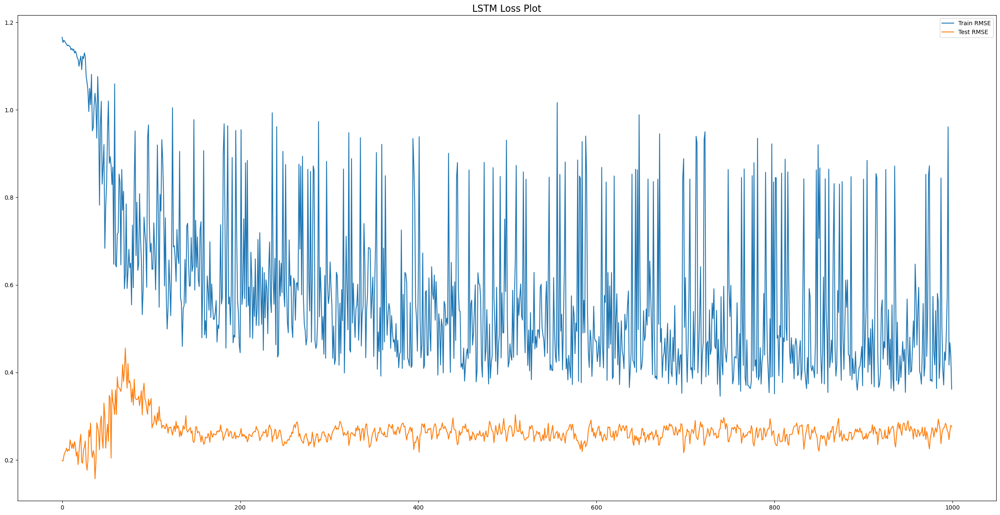

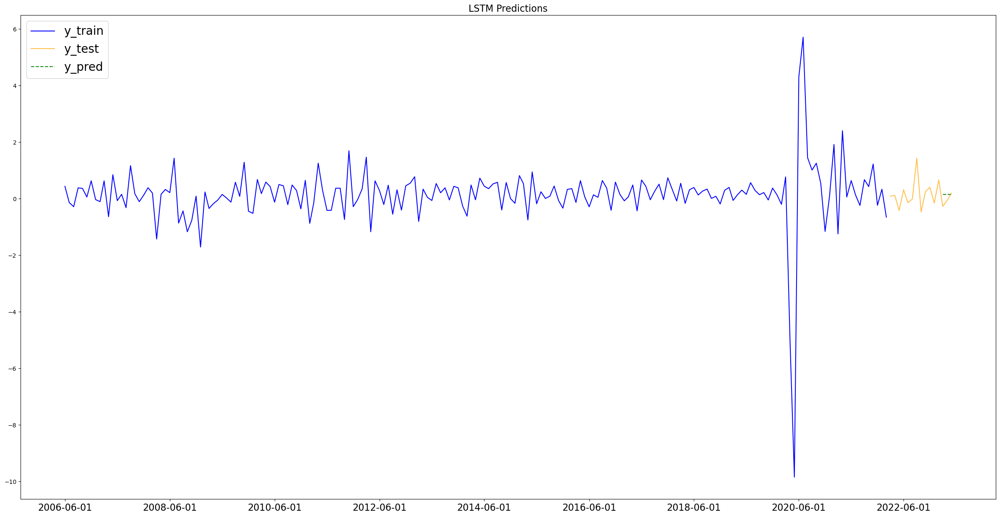

In [105]:
lstm_results = zm.lstm(all_features_2006_m, 'real_gdp_m_shift', X_train, X_test, y_train, y_test, length=12, batch_size=6, features=3, epoch=1000, periods=3, steps=24)

##### Observations

The below are the better set of hyperparameter tuning set that got me better results in general.

Settings For Model:
- 2 LSTM Layers with 10 nodes in the first and 8 in the second
- 2 dense layers with relu activation with a dropout(0.5) layer in between
- 1 output layer with identity activation
- Adam optimiser (0.001)
- loss = mse, metrics = RMSE
- early_stop with patience of 3

When tuning the hyperparameters, I note that the results are somwhat inconsistent even when the same settings was applied. There are moments where predictions were close to test values and there were moments when it wasnt. Therefore, my observations here will speak genereally of them. 

Further, I note that due to constraints on how Time Series Generator uses past data to train / predict on a future datapoint, the time periods that we will be using in this section to measure and observe LSTM's predictive abilities would be different from other models. With that said, predicted periods remain the same at 4 quarters.

We can observe that LSTM (All features) is unable to predict for direction and magnitude well for the next quarter's monthly gdp prints.

##### Summary

|Model|Predicting for|Dataset|Variables|Train RMSE|Test RMSE|
|--|--|--|--|--|--|
|ARIMA (AIC) Baseline|Next 12 Months|2006(M)|real_gdp_m|1.11|0.51|
|ARIMA (AIC) Baseline|Next 3 Months|2006(M)|real_gdp_m|1.09|0.25|
|SARIMA (M=2)|Next 12 Months|2006(M)|real_gdp_m|1.11|0.51|
|SARIMA (M=2)|Next 3 Months|2006(M)|real_gdp_m|1.09|0.25|
|SARIMAX (M=2)|Next 12 Months|2006(M)|All Features|0.42|0.53|
|SARIMAX (M=2)|Next 3 Months|2006(M)|All Features|0.43|0.40|
|SARIMAX (M=2)|Next 12 Months|2006(M)|All Features|0.49|0.52|
|SARIMAX (M=2)|Next 3 Months|2006(M)|All Features|0.48|0.37|
|Prophet|Next 12 Months|2006(M)|real_gdp_m|1.02|0.54|
|Prophet|Next 3 Months|2006(M)|real_gdp_m|1.00|0.56|
|BATS|Next 12 Months|2006(M)|real_gdp_m|N.A|0.52|
|BATS|Next 3 Months|2006(M)|real_gdp_m|N.A|0.27|
|TBATS|Next 12 Months|2006(M)|real_gdp_m|N.A|0.52|
|TBATS|Next 3 Months|2006(M)|real_gdp_m|N.A|0.27|
|Kalman Filter|Next 12 Months|2006(M)|real_gdp_m|0.69|0.50|
|Kalman Filter|Next 3 Months|2006(M)|real_gdp_m|0.68|0.66|
|LSTM|Next 12 Months|2006(M)|All Features|0.36|0.77|
|LSTM|Next 3 Months|2006(M)|All Features|0.78|0.30|
|LSTM|Next 12 Months|2006(M)|AC Features|0.50|0.52|
|LSTM|Next 3 Months|2006(M)|AC Features|0.36|0.28|

# Predicting Quarterly GDP with Monthly GDP

As we have seen earlier in this and the prior notebook, none of the models could predict for monthly gdp accurately. The models could not predict for direction and magnitude and this could lead to giving the wrong advise to our stakeholders. Perhaps we have hit a limit to the granularity of the periods of our features to predict for quarterly GDP or perhaps we may be looking at the wrong features altogether as monthly GDP is computed and produced by a private for profit company, [S&P Global Market Intelligence](https://www.spglobal.com/).

It is noteworthy and pleasing to note that by aggregating monthly features to quarterly periods, we are able to predict for quarterly gdp accurately from both a directional perspective and to an extent, the magnitude of quarterly GDP too. With that said, what is left to carry out would be to determine the accuracy of predicting for quarterly GDP by using monthly gdp data. 

I will be using the following models to explore this premise

1) LSTM 
2) SARIMAX (M=1)

## LSTM (gdp_m) Predicting 1 Year

In [134]:
# Declaring for X to be oecd and non farm payrolls
y = gdp_m_q_uns['gdp_q']
X = gdp_m_q_uns[['real_gdp_m']]

# Train Test Split With All Features for a test period of next 4 Quarters (1 Year)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.06, shuffle=False)

In [135]:
# Sequence check
zm.sequence_check(y_train, y_test)

Each split data head and tail will be printed in sequence of train head, train tail, test head, test tail
Period
1992-06-30    4.4
1992-09-30    4.0
1992-12-31    4.2
1993-03-31    0.7
1993-06-30    2.3
Freq: Q-DEC, Name: gdp_q, dtype: float64
Period
2020-06-30   -29.9
2020-09-30    35.3
2020-12-31     3.9
2021-03-31     6.3
2021-06-30     7.0
Freq: Q-DEC, Name: gdp_q, dtype: float64
Period
2021-09-30    2.7
2021-12-31    7.0
2022-03-31   -1.6
2022-06-30   -0.6
2022-09-30    3.2
Freq: Q-DEC, Name: gdp_q, dtype: float64
Period
2022-06-30   -0.6
2022-09-30    3.2
2022-12-31    2.6
2023-03-31    2.0
2023-06-30    2.4
Freq: Q-DEC, Name: gdp_q, dtype: float64


Epoch 1/400
57/57 [==============================] - 4s 15ms/step - loss: 31.0787 - root_mean_squared_error: 5.5748 - val_loss: 6.4095 - val_root_mean_squared_error: 2.5317
Epoch 2/400
57/57 [==============================] - 0s 4ms/step - loss: 30.7307 - root_mean_squared_error: 5.5435 - val_loss: 6.0304 - val_root_mean_squared_error: 2.4557
Epoch 3/400
57/57 [==============================] - 1s 9ms/step - loss: 30.2185 - root_mean_squared_error: 5.4971 - val_loss: 5.3630 - val_root_mean_squared_error: 2.3158
Epoch 4/400
57/57 [==============================] - 0s 6ms/step - loss: 29.3532 - root_mean_squared_error: 5.4179 - val_loss: 4.3574 - val_root_mean_squared_error: 2.0874
Epoch 5/400
57/57 [==============================] - 0s 4ms/step - loss: 27.8157 - root_mean_squared_error: 5.2741 - val_loss: 2.3613 - val_root_mean_squared_error: 1.5367
Epoch 6/400
57/57 [==============================] - 0s 4ms/step - loss: 26.8374 - root_mean_squared_error: 5.1805 - val_loss: 1.1029 - val

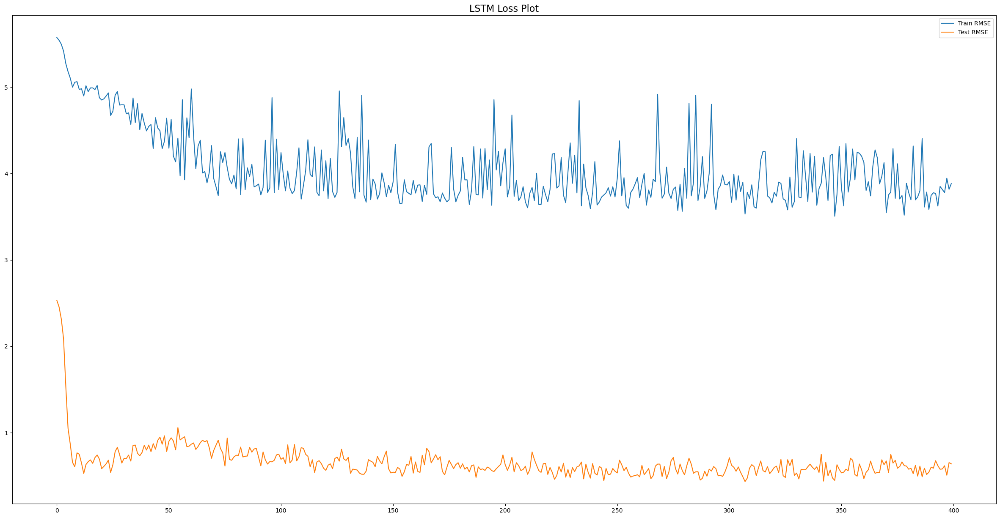

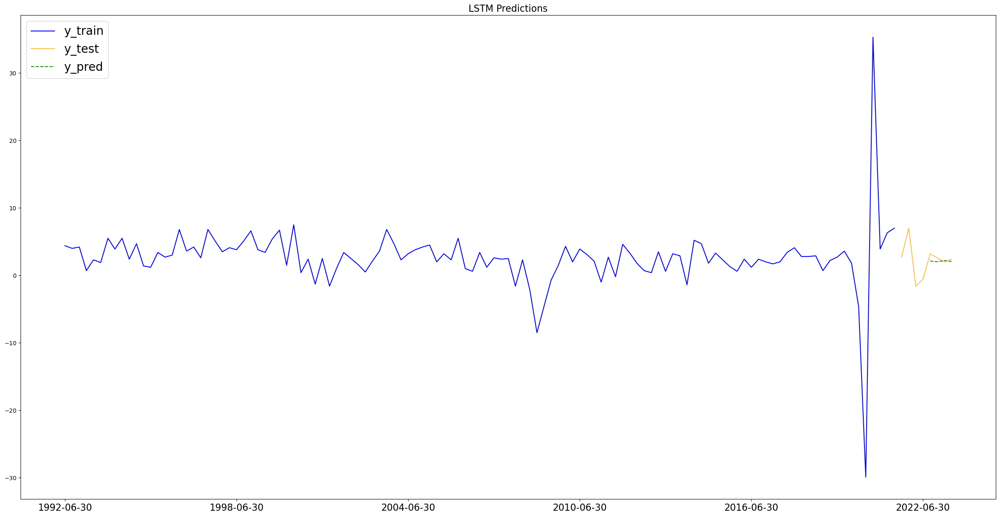

In [139]:
lstm_results = zm.lstm(gdp_m_q_uns, 'gdp_q', X_train, X_test, y_train, y_test, length=4, batch_size=2, features=1, epoch=400, periods=4, steps=24)

##### Observations

The below are the better set of hyperparameter tuning set that got me better results in general.

Settings For Model:
- 2 LSTM Layers with 10 nodes in the first and 8 in the second
- 2 dense layers with relu activation with a dropout(0.5) layer in between
- 1 output layer with identity activation
- Adam optimiser (0.001)
- loss = mse, metrics = RMSE
- early_stop with patience of 3

I note that due to constraints on how Time Series Generator uses past data to train / predict on a future datapoint, the time periods that we will be using in this section to measure and observe LSTM's predictive abilities would be different from other models. With that said, predicted periods remain the same at 4 quarters.

Here, we can observe that LSTM(gdp_m) was able to predict for quarterly gdp relatively well. It had all directions correct and its predicted magnitude was close and somewhat characteristic of quarterly gdp. I do note that LSTM (gdp_m) produced the lowest RMSE test values

## LSTM(gdp_m) Predicting 1 Quarter

In [109]:
# Train Test Split With All Features for a test period of next 1 Quarter 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.035, shuffle=False)

In [110]:
# Sequence check
zm.sequence_check(y_train, y_test)

Each split data head and tail will be printed in sequence of train head, train tail, test head, test tail
Period
1992-06-30    4.4
1992-09-30    4.0
1992-12-31    4.2
1993-03-31    0.7
1993-06-30    2.3
Freq: Q-DEC, Name: gdp_q, dtype: float64
Period
2021-03-31    6.3
2021-06-30    7.0
2021-09-30    2.7
2021-12-31    7.0
2022-03-31   -1.6
Freq: Q-DEC, Name: gdp_q, dtype: float64
Period
2022-06-30   -0.6
2022-09-30    3.2
2022-12-31    2.6
2023-03-31    2.0
2023-06-30    2.4
Freq: Q-DEC, Name: gdp_q, dtype: float64
Period
2022-06-30   -0.6
2022-09-30    3.2
2022-12-31    2.6
2023-03-31    2.0
2023-06-30    2.4
Freq: Q-DEC, Name: gdp_q, dtype: float64


Epoch 1/1000
58/58 [==============================] - 4s 13ms/step - loss: 30.7745 - root_mean_squared_error: 5.5475 - val_loss: 5.4464 - val_root_mean_squared_error: 2.3337
Epoch 2/1000
58/58 [==============================] - 0s 4ms/step - loss: 30.3917 - root_mean_squared_error: 5.5129 - val_loss: 5.0585 - val_root_mean_squared_error: 2.2491
Epoch 3/1000
58/58 [==============================] - 0s 4ms/step - loss: 29.9219 - root_mean_squared_error: 5.4701 - val_loss: 4.5984 - val_root_mean_squared_error: 2.1444
Epoch 4/1000
58/58 [==============================] - 0s 4ms/step - loss: 29.3794 - root_mean_squared_error: 5.4203 - val_loss: 4.1109 - val_root_mean_squared_error: 2.0275
Epoch 5/1000
58/58 [==============================] - 0s 4ms/step - loss: 28.8238 - root_mean_squared_error: 5.3688 - val_loss: 3.5706 - val_root_mean_squared_error: 1.8896
Epoch 6/1000
58/58 [==============================] - 0s 4ms/step - loss: 28.2409 - root_mean_squared_error: 5.3142 - val_loss: 3.0631

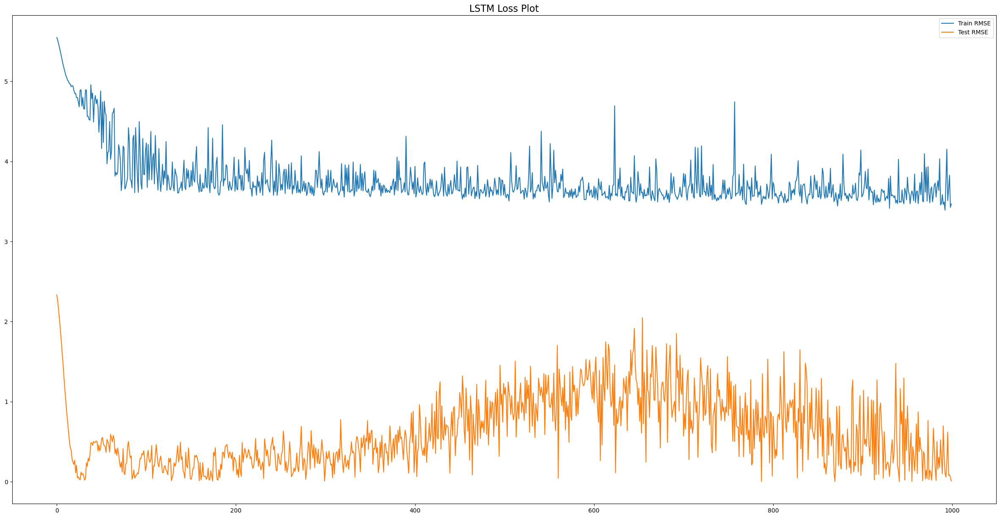

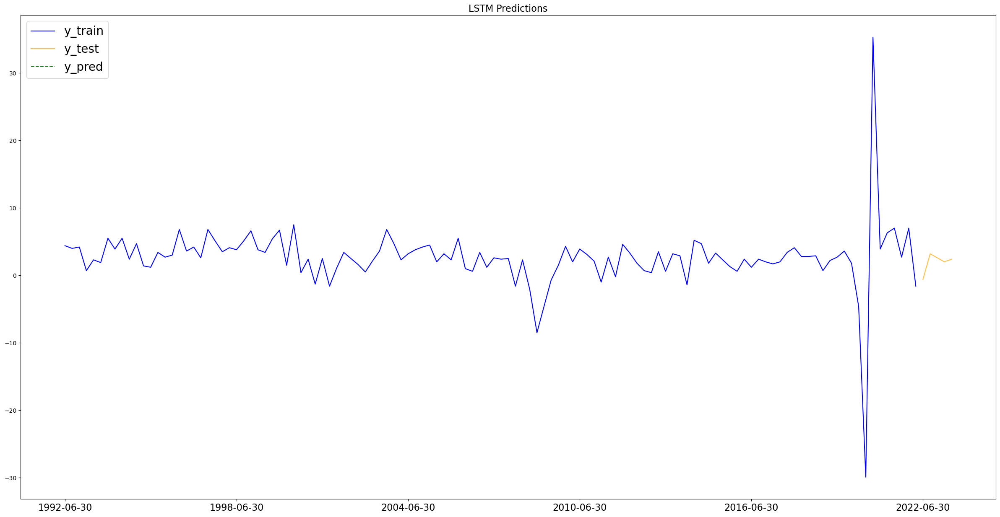

In [111]:
lstm_results = zm.lstm(gdp_m_q_uns, 'gdp_q', X_train, X_test, y_train, y_test, length=4, batch_size=2, features=1, epoch=1000, periods=1, steps=24)

The below are the better set of hyperparameter tuning set that got me better results in general.

Settings For Model:
- 2 LSTM Layers with 10 nodes in the first and 8 in the second
- 2 dense layers with relu activation with a dropout(0.5) layer in between
- 1 output layer with identity activation
- Adam optimiser (0.001)
- loss = mse, metrics = RMSE
- early stop with patience of 3

When tuning the hyperparameters, I note that the results are somwhat inconsistent even when the same settings was applied. There are moments where predictions were close to test values and there were moments when it wasnt. Therefore, my observations here will speak genereally of them. 

Further, I note that due to constraints on how Time Series Generator uses past data to train / predict on a future datapoint, the time periods that we will be using in this section to measure and observe LSTM's predictive abilities would be different from other models. With that said, predicted periods remain the same at 4 quarters.

As y_pred is not visually observable on the plot, we will observe its numerical prediction. On most occassions, LSTM was able to predict for direction and magnitude well.

## Observing for LSTM(gdp_m) 'Robustness'

In [140]:
# Train Test Split With All Features for a test period of next 1 Quarter 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, shuffle=False)

Epoch 1/100
45/45 [==============================] - 4s 21ms/step - loss: 12.8200 - root_mean_squared_error: 3.5805 - val_loss: 87.1414 - val_root_mean_squared_error: 9.3350
Epoch 2/100
45/45 [==============================] - 0s 5ms/step - loss: 12.4081 - root_mean_squared_error: 3.5225 - val_loss: 86.7121 - val_root_mean_squared_error: 9.3119
Epoch 3/100
45/45 [==============================] - 0s 5ms/step - loss: 11.8979 - root_mean_squared_error: 3.4493 - val_loss: 86.0822 - val_root_mean_squared_error: 9.2781
Epoch 4/100
45/45 [==============================] - 0s 5ms/step - loss: 10.7500 - root_mean_squared_error: 3.2787 - val_loss: 84.7732 - val_root_mean_squared_error: 9.2072
Epoch 5/100
45/45 [==============================] - 0s 4ms/step - loss: 9.1504 - root_mean_squared_error: 3.0250 - val_loss: 82.8597 - val_root_mean_squared_error: 9.1027
Epoch 6/100
45/45 [==============================] - 0s 5ms/step - loss: 7.2451 - root_mean_squared_error: 2.6917 - val_loss: 81.7158 -

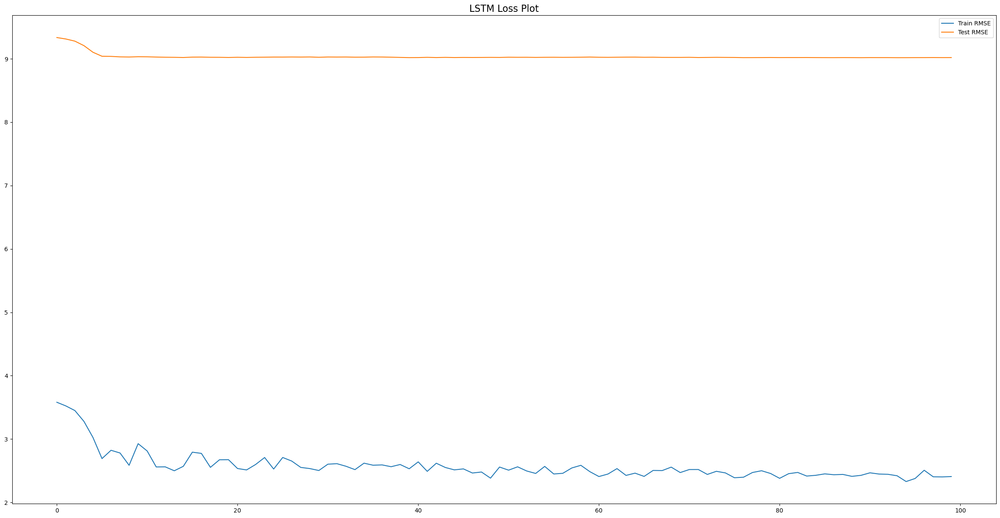

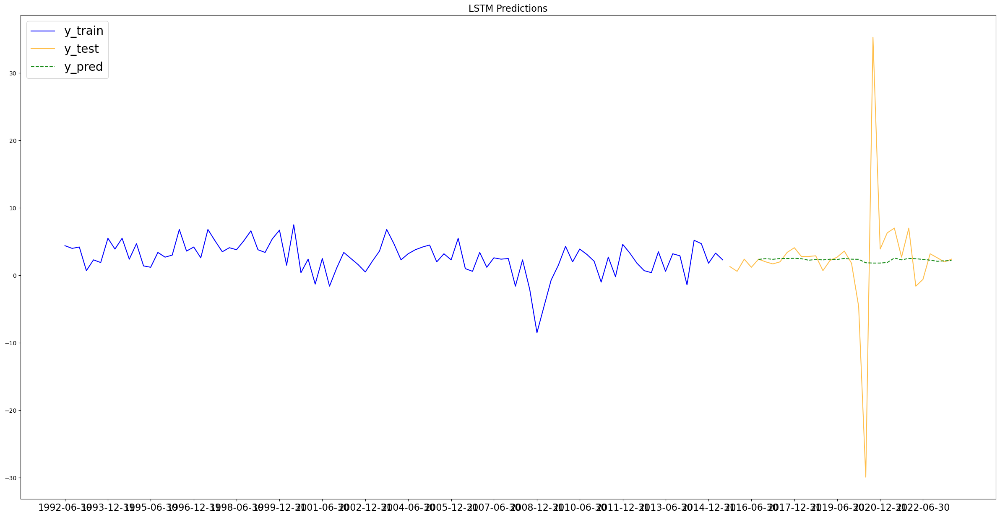

In [141]:
lstm_results = zm.lstm(gdp_m_q_uns, 'gdp_q', X_train, X_test, y_train, y_test, length=4, batch_size=2, features=1, epoch=100, periods=28, steps=6)

##### Observation

LSTM appears is not robust enough to produce predictions over longer time periods, given this dataset. It appears that LSTM is unable to predict for magnitude and direction of quarterly gdp. 

The loss plot above seem to indicate that the model has overtrained on train data and does not generalize well to test data.

In summary, LSTM seem to perform relatively better when predicting over shorter time frames for quarterly gdp.

##### Summary

|Model|Predicting for|Dataset|Variables|Train RMSE|Test RMSE|
|--|--|--|--|--|--|
|ARIMA (AIC) Baseline|Next 4 Quarters|2006(Q)|gdp_q|6.36|1.68|
|ARIMA (AIC) Baseline|Next 1 Quarter|2006(Q)|gdp_q|6.22|0.36|
|SARIMA (M=1)|Next 4 Quarters|2006(Q)|gdp_q|6.36|1.68|
|SARIMA (M=1)|Next 1 Quarter|2006(Q)|gdp_q|6.22|0.36|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|All Features|2.29|1.82|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|All Features|2.28|1.13|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|AC Features|3.07|1.15|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|AC Features|2.91|1.35|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|payrolls|6.50|0.30|
|Prophet|Next 4 Quarters|2006(Q)|gdp_q|5.82|2.41|
|Prophet|Next 1 Quarter|2006(Q)|gdp_q|5.70|0.75|
|BATS|Next 4 Quarters|2006(Q)|gdp_q|N.A|1.14|
|BATS|Next 1 Quarter|2006(Q)|gdp_q|N.A|0.87|
|TBATS|Next 4 Quarters|2006(Q)|gdp_q|N.A|1.14|
|TBATS|Next 1 Quarter|2006(Q)|gdp_q|N.A|0.87|
|Kalman Filter|Next 4 Quarters|2006(Q)|gdp_q|4.09|5.42|
|Kalman Filter|Next 1 Quarter|2006(Q)|gdp_q|4.01|0.82|
|LSTM|Next 4 Quarters|2006(Q)|All Features|2.14|1.19|
|LSTM|Next 1 Quarter|2006(Q)|All Features|2.04|0.05|
|LSTM|Next 4 Quarters|2006(Q)|AC Features|4.28|0.83|
|LSTM|Next 1 Quarter|2006(Q)|AC Features|3.25|0.20|
|LSTM|Next 1 Quarter|2006(Q)|payrolls|4.15|0.18|
|LSTM|Next 4 Quarter|2006(Q)|gdp_m|3.88|0.64|
|LSTM|Next 1 Quarter|2006(Q)|gdp_m|3.47|0.01|

## SARIMAX (gdp_m) Predicting 1 Year

In [142]:
# Declaring for X to be oecd and non farm payrolls
y = gdp_m_q_uns['gdp_q']
X = gdp_m_q_uns[['real_gdp_m']]

# Train Test Split With All Features for a test period of next 4 Quarters (1 Year)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.03, shuffle=False)

In [143]:
# Sequence check
zm.sequence_check(y_train, y_test)

Each split data head and tail will be printed in sequence of train head, train tail, test head, test tail
Period
1992-06-30    4.4
1992-09-30    4.0
1992-12-31    4.2
1993-03-31    0.7
1993-06-30    2.3
Freq: Q-DEC, Name: gdp_q, dtype: float64
Period
2021-06-30    7.0
2021-09-30    2.7
2021-12-31    7.0
2022-03-31   -1.6
2022-06-30   -0.6
Freq: Q-DEC, Name: gdp_q, dtype: float64
Period
2022-09-30    3.2
2022-12-31    2.6
2023-03-31    2.0
2023-06-30    2.4
Freq: Q-DEC, Name: gdp_q, dtype: float64
Period
2022-09-30    3.2
2022-12-31    2.6
2023-03-31    2.0
2023-06-30    2.4
Freq: Q-DEC, Name: gdp_q, dtype: float64


Instantiating model and printing grid search values:

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=730.100, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=728.192, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=728.283, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=758.925, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=730.108, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=730.123, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=731.904, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=760.562, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.535 seconds

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  121
Model:               SARIMAX(1, 0, 0)   Log Likelihood                -360.096
Date:                Mon, 11 Sep 2023   AIC                         

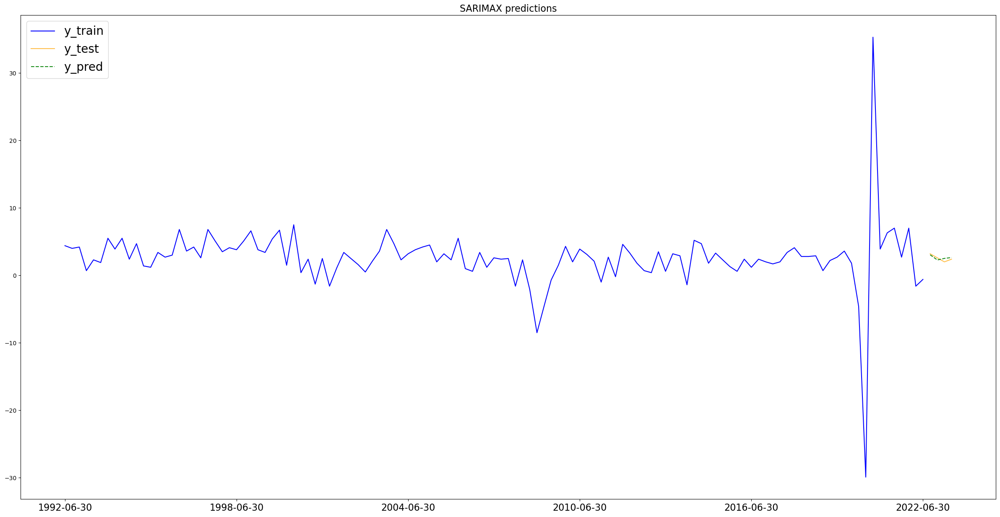

In [144]:
y_pred = zm.sarimax_pipeline(gdp_m_q_uns, X_train, y_train, X_test, y_test, sp=0, mp=10, d=None, sq=0, mq=10, sP=0, mP=0, D=None, sQ=0, mQ=0, m=1, steps=24)

In [145]:
zm.show_values(y_pred, y_test)

========== Predicted Values ==========
2022-09-30    3.047722
2022-12-31    2.282622
2023-03-31    2.514267
2023-06-30    2.646321
Freq: Q-DEC, dtype: float64
========== Test Values ==========
Period
2022-09-30    3.2
2022-12-31    2.6
2023-03-31    2.0
2023-06-30    2.4
Freq: Q-DEC, Name: gdp_q, dtype: float64


##### Observations

SARIMAX (M=1, gdp_m) is able to predict for the next year well. It's direcetion and magnitude is characteristic of y_test and the predictions are close to true value.

## SARIMAX (gdp_m) Predicting 1 Quarter

In [146]:
# Train Test Split With All Features for a test period of next 4 Quarters (1 Year)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.005, shuffle=False)

In [147]:
# Sequence check
zm.sequence_check(y_train, y_test)

Each split data head and tail will be printed in sequence of train head, train tail, test head, test tail
Period
1992-06-30    4.4
1992-09-30    4.0
1992-12-31    4.2
1993-03-31    0.7
1993-06-30    2.3
Freq: Q-DEC, Name: gdp_q, dtype: float64
Period
2022-03-31   -1.6
2022-06-30   -0.6
2022-09-30    3.2
2022-12-31    2.6
2023-03-31    2.0
Freq: Q-DEC, Name: gdp_q, dtype: float64
Period
2023-06-30    2.4
Freq: Q-DEC, Name: gdp_q, dtype: float64
Period
2023-06-30    2.4
Freq: Q-DEC, Name: gdp_q, dtype: float64


Instantiating model and printing grid search values:

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=745.043, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=743.026, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=743.113, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=775.355, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=744.935, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=744.951, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=746.726, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=776.858, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 0.402 seconds

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  124
Model:               SARIMAX(1, 0, 0)   Log Likelihood                -367.513
Date:                Mon, 11 Sep 2023   AIC                         

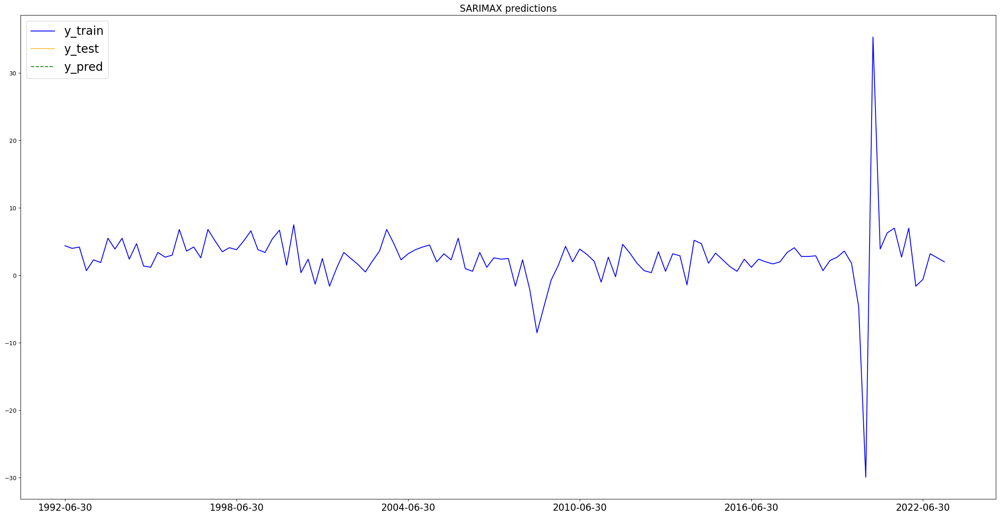

In [148]:
y_pred = zm.sarimax_pipeline(gdp_m_q_uns, X_train, y_train, X_test, y_test, sp=0, mp=10, d=None, sq=0, mq=10, sP=0, mP=0, D=None, sQ=0, mQ=0, m=1, steps=24)

In [121]:
zm.show_values(y_pred, y_test)

========== Predicted Values ==========
2023-06-30    2.765314
Freq: Q-DEC, dtype: float64
========== Test Values ==========
Period
2023-06-30    2.4
Freq: Q-DEC, Name: gdp_q, dtype: float64


##### Observations

SARIMAX (M=1, gdp_m) is able to predict for the next quarter well. It's direction and magnitude is characteristic of y_test and the prediction are close to true value.

## Observing for SARIMAX (gdp_m) 'Robustness'

In [149]:
# Train Test Split With All Features for a test period of next 4 Quarters (1 Year)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, shuffle=False)

Instantiating model and printing grid search values:

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=424.894, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=419.176, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=422.218, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=485.004, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=414.799, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=416.773, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=416.779, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=416.500, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=418.738, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=425.537, Time=0.02 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.454 seconds

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   93
Model:           

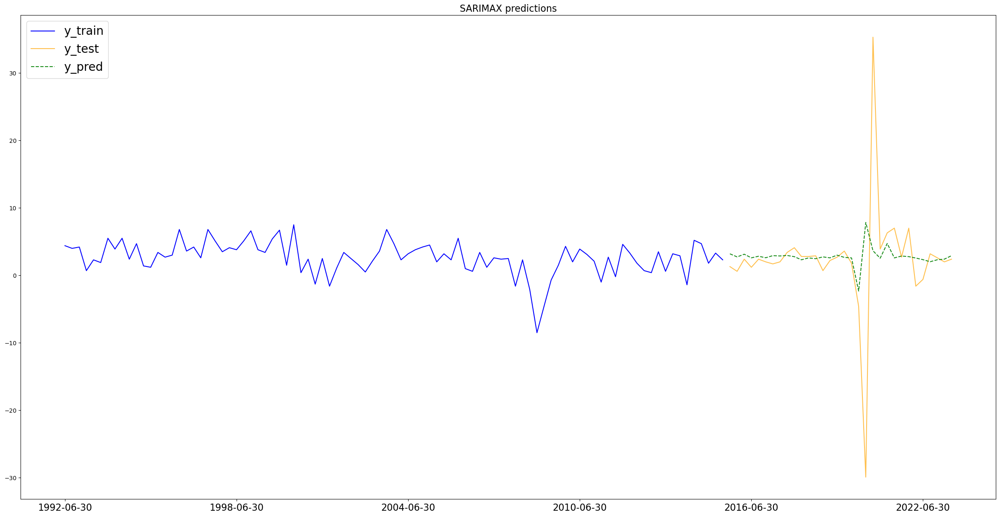

In [150]:
y_pred = zm.sarimax_pipeline(gdp_m_q_uns, X_train, y_train, X_test, y_test, sp=0, mp=10, d=None, sq=0, mq=10, sP=0, mP=0, D=None, sQ=0, mQ=0, m=1, steps=24)

##### Observations

We can observe that from the above, SARIMAX(M=1, gdp_m) may have predicted shorter prediction timeframes well, but it falls short when trying to predict for a longer timeframe.

##### Summary

|Model|Predicting for|Dataset|Variables|Train RMSE|Test RMSE|
|--|--|--|--|--|--|
|ARIMA (AIC) Baseline|Next 4 Quarters|2006(Q)|gdp_q|6.36|1.68|
|ARIMA (AIC) Baseline|Next 1 Quarter|2006(Q)|gdp_q|6.22|0.36|
|SARIMA (M=1)|Next 4 Quarters|2006(Q)|gdp_q|6.36|1.68|
|SARIMA (M=1)|Next 1 Quarter|2006(Q)|gdp_q|6.22|0.36|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|All Features|2.29|1.82|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|All Features|2.28|1.13|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|AC Features|3.07|1.15|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|AC Features|2.91|1.35|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|payrolls|6.50|0.30|
|Prophet|Next 4 Quarters|2006(Q)|gdp_q|5.82|2.41|
|Prophet|Next 1 Quarter|2006(Q)|gdp_q|5.70|0.75|
|BATS|Next 4 Quarters|2006(Q)|gdp_q|N.A|1.14|
|BATS|Next 1 Quarter|2006(Q)|gdp_q|N.A|0.87|
|TBATS|Next 4 Quarters|2006(Q)|gdp_q|N.A|1.14|
|TBATS|Next 1 Quarter|2006(Q)|gdp_q|N.A|0.87|
|Kalman Filter|Next 4 Quarters|2006(Q)|gdp_q|4.09|5.42|
|Kalman Filter|Next 1 Quarter|2006(Q)|gdp_q|4.01|0.82|
|LSTM|Next 4 Quarters|2006(Q)|All Features|2.14|1.19|
|LSTM|Next 1 Quarter|2006(Q)|All Features|2.04|0.05|
|LSTM|Next 4 Quarters|2006(Q)|AC Features|4.28|0.83|
|LSTM|Next 1 Quarter|2006(Q)|AC Features|3.25|0.20|
|LSTM|Next 1 Quarter|2006(Q)|payrolls|4.15|0.18|
|LSTM|Next 4 Quarter|2006(Q)|gdp_m|3.88|0.64|
|LSTM|Next 1 Quarter|2006(Q)|gdp_m|3.47|0.01|
|SARIMAX (M=1)|Next 4 Quarters|2006(Q)|gdp_m|4.88|0.34|
|SARIMAX (M=1)|Next 1 Quarter|2006(Q)|gdp_m|4.82|0.37|

# End of Notebook

Please [click here](05_Eval_Concl.ipynb) to proceed to the next notebook.

Feel free to click on the following notebooks to 'fast forward' to other sections of this project.

|Notebook Title|Description|
|---|---|
|[Introduction & Data Cleaning](01_Intro_Data_Cleaning.ipynb)|This notebook contains the introduction of the project, background motivation, problem statement and the inspection and cleaning of data.|
|[EDA](02_EDA.ipynb)|This notebook contains details on Exploratory Data Analysis.|
|[Modelling](03_Modelling.ipynb)|This notebook contains details on Modelling the data from a time series perspective.|
|[Modelling 2](04_Modelling2.ipynb)|This notebook contains details on time series Modelling with ARIMA, SARIMA and SARIMAX.|
|[Evaluation & Conclusion](05_Eval_Concl.ipynb)|This notebook contains details on model selection, evaluation and conclusion to the project|